<table width=100%>
<tr>
    <td><h1 style="text-align: left; font-size:300%;">
        Mice protein expression
    </h1></td>
    <td width="20%">
    <div style="text-align: right">
    <b> Machine Learning 2022</b> <br>
    <b>Third homework - 17/06/2022<br>
    Erik Bot - 995881 <br>
    Personal Code - 10867885 <br>
    <a href="mailto:erik.bot@mail.polimi.it">erik.bot@mail.polimi.it</a><br>
    </div>
    </td>
</tr>
</table>

Note: some packages have been installed to perform some parts of the analysis. The code is given down below, but commented, to avoid re-installing the packages every time. If the code breaks, it might be due to this.

In [2]:
import sys
#!{sys.executable} -m pip install scikit-learn-extra
#!{sys.executable} -m pip install umap-learn
#!{sys.executable} -m pip install plotly

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors   
import seaborn as sns
import pandas as pd
import numpy as np
import sklearn
import random
import umap
import plotly.express as px

from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.manifold import TSNE
from umap import UMAP
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import normalize
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV


np.random.seed(0)

## Dataset presentation and initial analysis 

The dataset on which we will work registered 77 protein expression levels across 1080 mice/replicates detected in the nuclear fraction of the cortex in response to learning processes. The mice are subdivided into 8 classes, based on their genotype, treatment and behavior (2 classes for each category = 8 classes overall). The aim of the study is to find structures in the data that allow to identify the different classes in our samples.

We decided to remove samples with a number of missing values higher than half of the proteins and to fill the remaining NaNs with the mean of the columns grouped by class.

In [3]:
mp_data = pd.read_excel('Data_Cortex_Nuclear.xls', header = 0)

mp_data = mp_data.drop('MouseID', 1)
# The information is stored in one column that summarizes all classes, so we can drop the Genotype, Treatment and Behavior columns.
mp_data = mp_data.drop('Genotype', 1)
mp_data = mp_data.drop('Treatment', 1)
mp_data = mp_data.drop('Behavior', 1)
mp_data = mp_data.rename(columns = {'class':'Class'})

is_NaN = mp_data.isnull().transpose()
for el in is_NaN.columns:
    if is_NaN[el].sum() > (len(is_NaN))/2:
        mp_data = mp_data.drop([el])

for p in mp_data.columns:
    if p != 'Class':
        mp_data[p] = mp_data[p].fillna(mp_data.groupby('Class')[p].transform('mean'))

mp_data['Class'] = mp_data['Class'].replace({'c-CS-m':0, 'c-SC-m':2, 'c-CS-s':1, 'c-SC-s': 3, 't-CS-m': 4, 't-CS-s': 5, 't-SC-m': 6, 't-SC-s':7})

mp_data.reset_index(drop=True, inplace=True)

mp_data

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Class
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,0.122652,0.132539,0.106305,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,0
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,0.116682,0.132539,0.106592,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,0
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,0.118508,0.132539,0.108303,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,0
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,0.132781,0.132539,0.103184,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,0
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,0.129954,0.132539,0.104784,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1072,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,0.190483,0.137119,0.115806,0.183324,0.374088,0.318782,0.204660,0.328327,1.364823,7
1073,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,0.190463,0.137119,0.113614,0.175674,0.375259,0.325639,0.200415,0.293435,1.364478,7
1074,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,0.216682,0.137119,0.118948,0.158296,0.422121,0.321306,0.229193,0.355213,1.430825,7
1075,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,0.222263,0.137119,0.125295,0.196296,0.397676,0.335936,0.251317,0.365353,1.404031,7


In [6]:
for i in mp_data['Class']:
    print(i)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3
3


We can then subdivide our dataset in the proteins and the classes.

In [7]:
X = mp_data[[x for x in mp_data.columns if x != 'Class']]
Y = mp_data[['Class']]

X.to_csv('C:/Users/boter/Desktop/Scientific Programming/Python/cancer.csv', index = False)

print(X.shape)
print(Y.shape)

(1077, 77)
(1077, 1)


We can then go on and normalize our data.

In [4]:
X = sklearn.preprocessing.normalize(X, axis = 0)

## Data visualization

We can then have a first visualization to see if the different protein expression levels already cluster together in a clear and meaningful way.

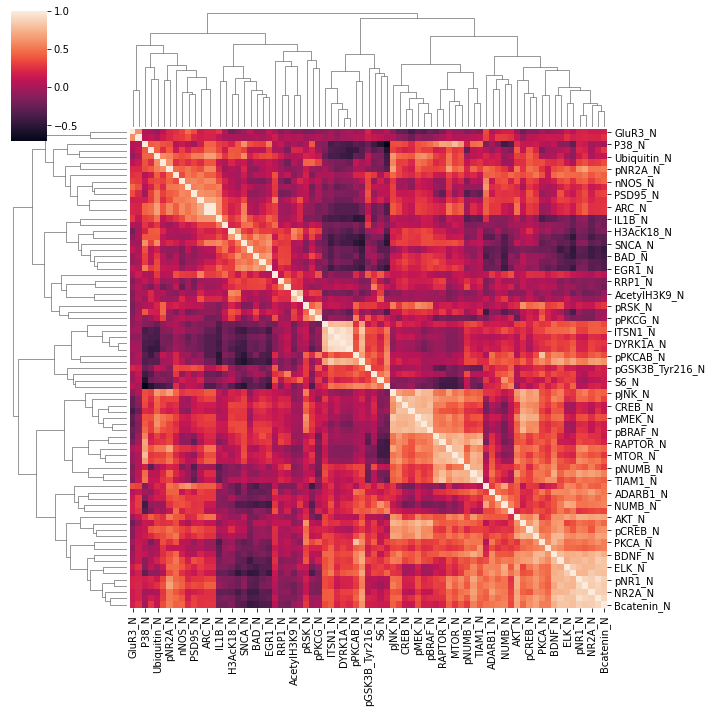

In [5]:
sns.clustermap(mp_data[[x for x in mp_data.columns if x != 'Class']].corr())

We can see that along the diagonal some structures of higher correlation appear.

We can then create two functions, one for the tSNE plots and one for the UMAP plots, made in 3D. In this way we can see how our data is distributed.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


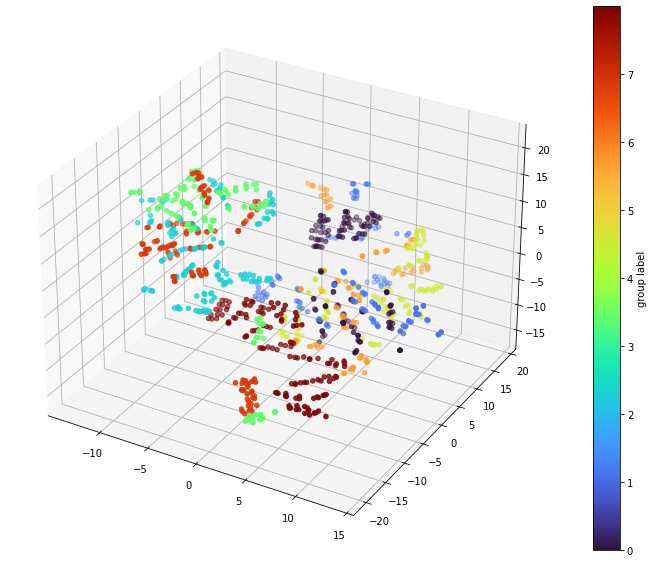

In [6]:
def tsne3d(X, labels):
    
    %matplotlib inline
    pca = TSNE(n_components=3)
    X = pca.fit_transform(X)
    
    unique_labels = np.unique(labels)
    
    labels = labels.copy()
    labels += np.abs(unique_labels.min())
    nlabels = len(unique_labels)
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    
    col = ('turbo' if nlabels <= 10 else 
          ('tab20' if nlabels <= 20 else
           'hsv'))
    cmap = plt.cm.get_cmap(col)
    smap = cm.ScalarMappable(
              norm=mcolors.Normalize(unique_labels.min(), unique_labels.max()+1), 
              cmap=cmap)
    
    ax.scatter(xs=X[:, 0], ys=X[:, 1], zs=X[:, 2], c=labels, cmap=cmap)
    
    plt.colorbar(mappable=smap, label='group label', ticks=range(nlabels))
    
tsne3d(X, labels=Y)

In [8]:
def umap3d(X, label):

    label = np.array(label)
    label = label.reshape(1,-1).flatten()
    labels = pd.Series(label)
    
    %matplotlib inline
    umap_3d = UMAP(n_components = 3, init='random', random_state=0)
    proj_3d = umap_3d.fit_transform(X)
    
    fig_3d = px.scatter_3d(
        proj_3d, x=0, y=1, z=2,
        color=labels, labels='group label', title = 'UMAP'
    )
    fig_3d.update_traces(marker_size=5)


    fig_3d.show()

umap3d(X, Y)

### Dendrogram

We can then plot a dendrogram, which directly shows the formation of the different clusters, starting from N clusters (where N = number of data points) and merges the first closest clusters together and then goes on iteratively until you get one big cluster. The height in the dendrogram represents the dissimilarity of the two merged clusters. You first have to define the linkage method and the distance metric to use. After the definition of the dendrogram, you can choose the number of clusters that you want by cutting it (from the top).

In [8]:
Z = linkage(X, method = 'complete', metric='euclidean')

Z.shape

(1076, 4)

In [9]:
def plot_dendrogram(Z=None, model=None, X=None, **kwargs):
    annotate_above = kwargs.pop('annotate_above', 0)

    if Z is None:
        if hasattr(model, 'distances_') and model.distances_ is not None:
            
            counts = np.zeros(model.children_.shape[0])
            n_samples = len(model.labels_)
            for i, merge in enumerate(model.children_):
                current_count = 0
                for child_idx in merge:
                    if child_idx < n_samples:
                        current_count += 1 
                    else:
                        current_count += counts[child_idx - n_samples]
                counts[i] = current_count

            Z = np.column_stack([model.children_, model.distances_,
                                              counts]).astype(float)
        else:
            Z = linkage(X, method=model.linkage, metric=model.affinity)
    
    if 'n_clusters' in kwargs:
        n_clusters = kwargs.pop('n_clusters')
        
        kwargs['color_threshold'] = Z[-n_clusters, 2] + 1e-6
        
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111)
    
    ddata = dendrogram(Z, ax=ax, **kwargs)
    
    for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
        x = 0.5 * sum(i[1:3])
        y = d[1]
        nid = np.where(Z[:,2] == y)[0][0]
        if y > annotate_above:
            plt.plot(x, y, 'o', c=c)
            plt.annotate(str(nid-Z.shape[0]), (x, y), xytext=(0, -5),
                          textcoords='offset points',
                          va='top', ha='center')
    if kwargs['color_threshold']:
        plt.axhline(y=kwargs['color_threshold'], c='k')
    
    return fig, ax
   

(<Figure size 1440x720 with 1 Axes>, <AxesSubplot:>)

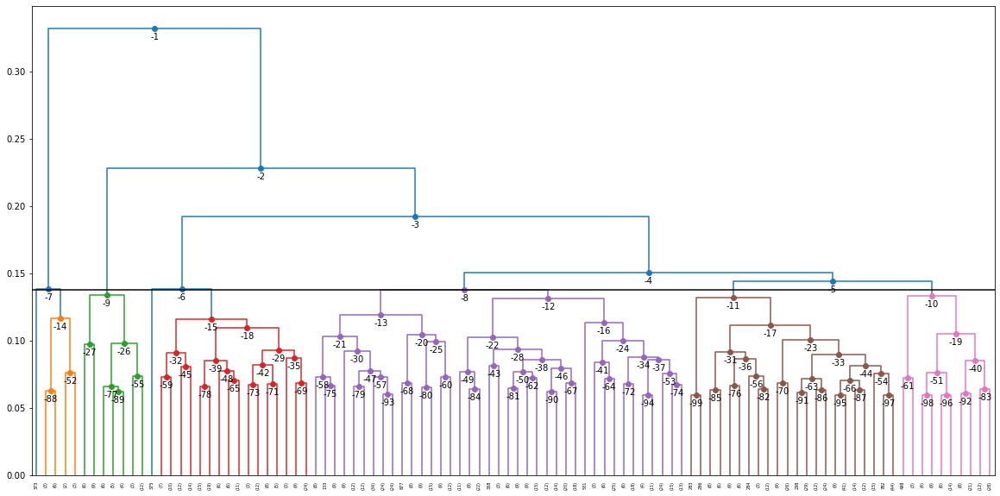

In [10]:
%matplotlib inline
plot_dendrogram(Z=Z, X=X,
                truncate_mode='lastp', 
                p=100, n_clusters=8)

We can check the dendrograms with different linkage methods and we can see that the best ones are the complete and ward linkages.

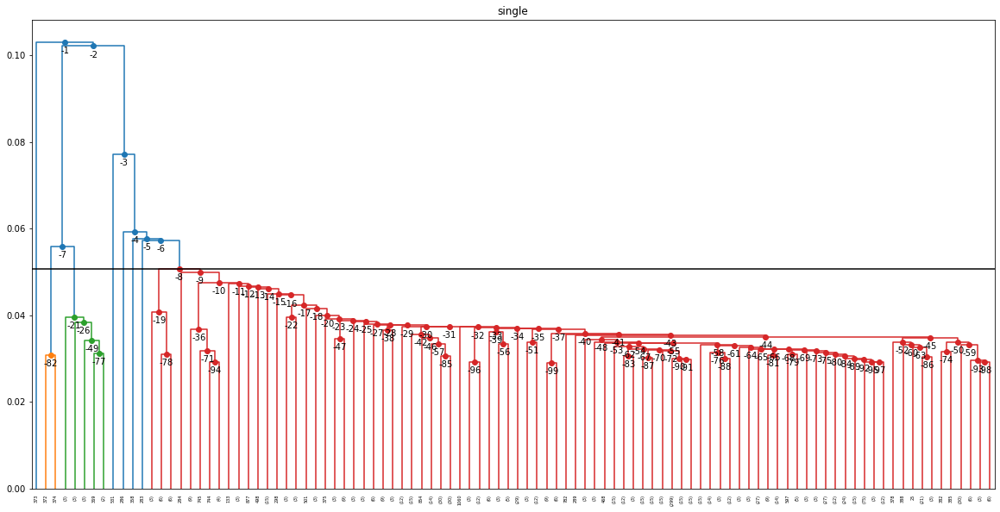

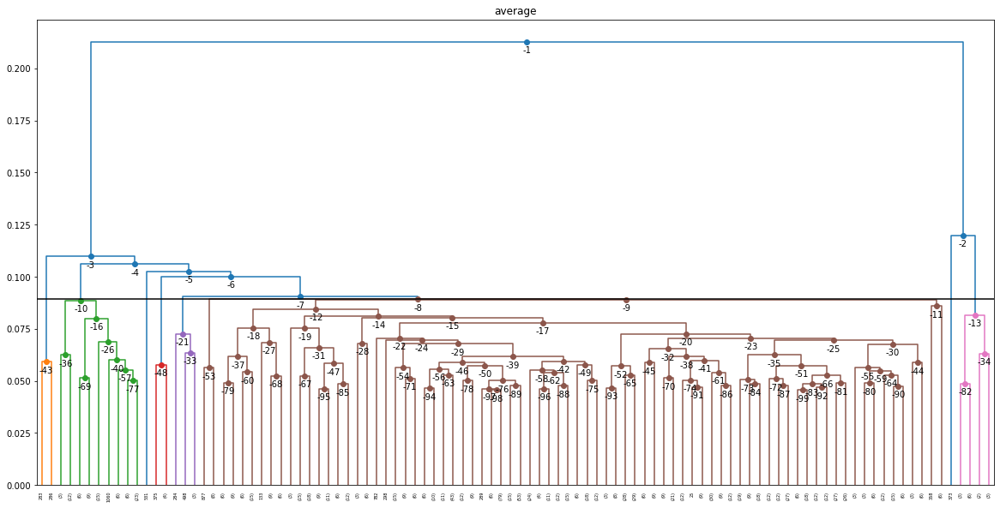

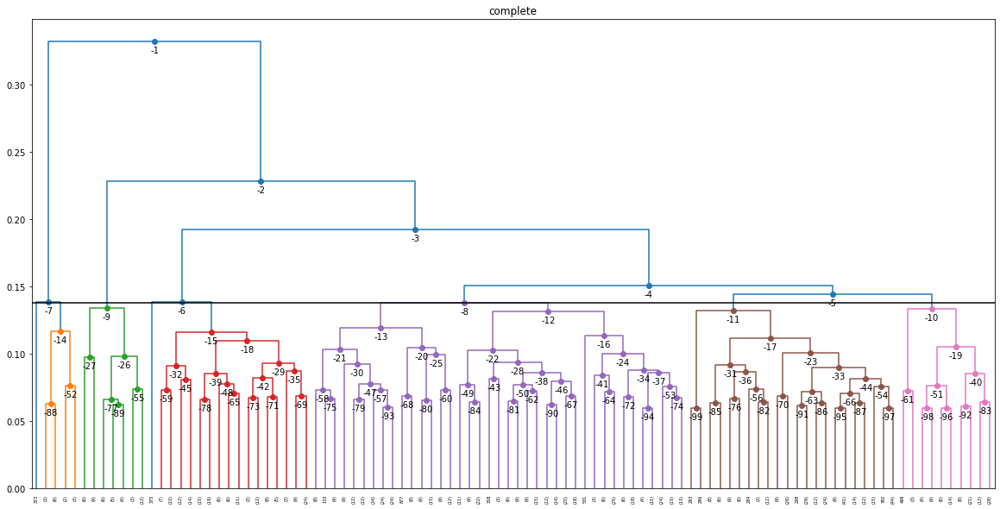

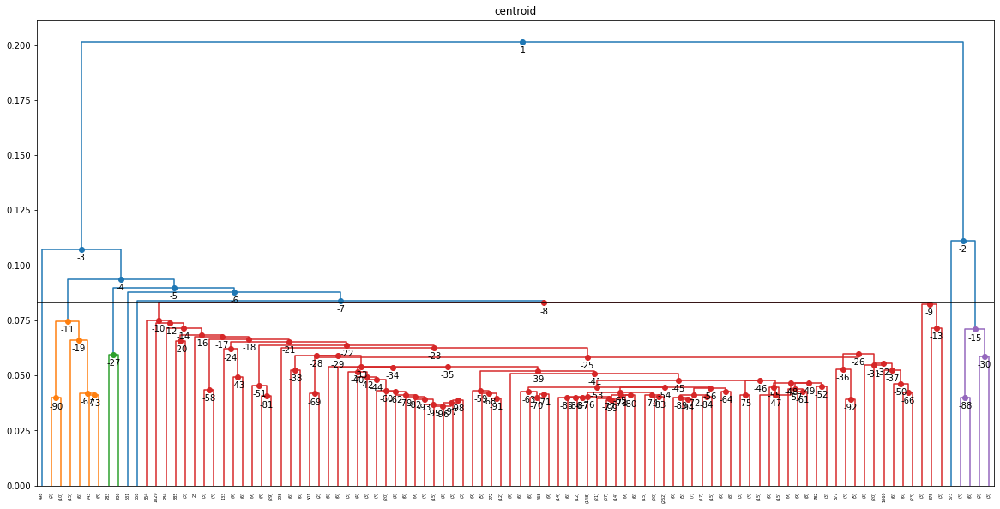

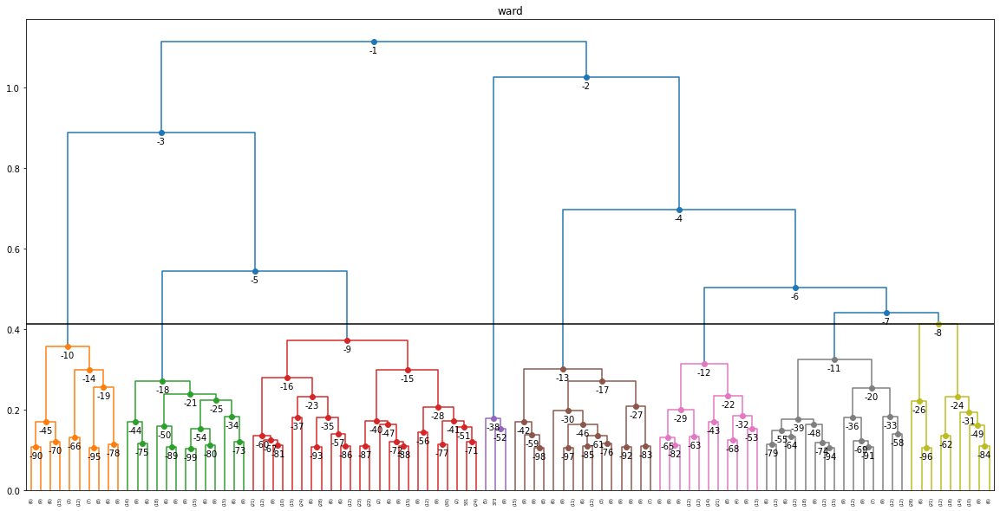

In [11]:
methods = ['single', 'average', 'complete', 'centroid', 'ward']

for method in methods:
    Z = linkage(X, method = method, metric='euclidean')
    fig, ax = plot_dendrogram(Z=Z, X=X, truncate_mode='lastp', 
                              p=100, n_clusters=8)
    ax.set_title(method)
    plt.plot()

We can then choose a number of clusters (8 in our case, because we have 8 different output classes) and create a bottom-up hierarchical clustering method (agglomerative) and check the resulting tSNE, UMAP and dendrogram.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



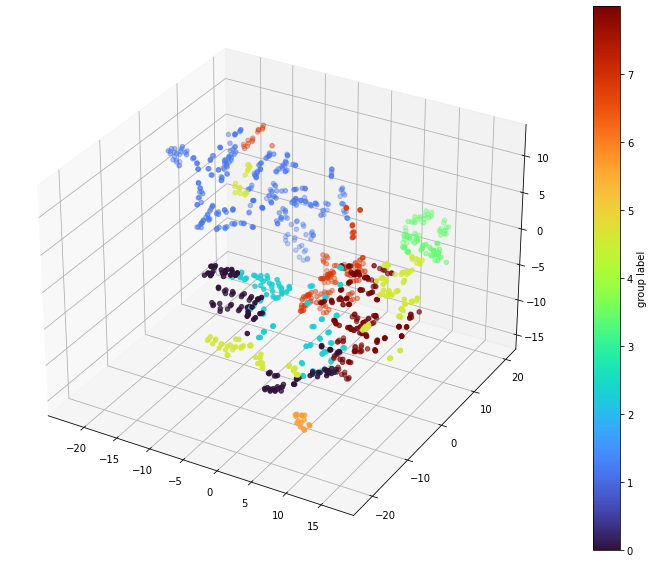

(<Figure size 1440x720 with 1 Axes>, <AxesSubplot:>)

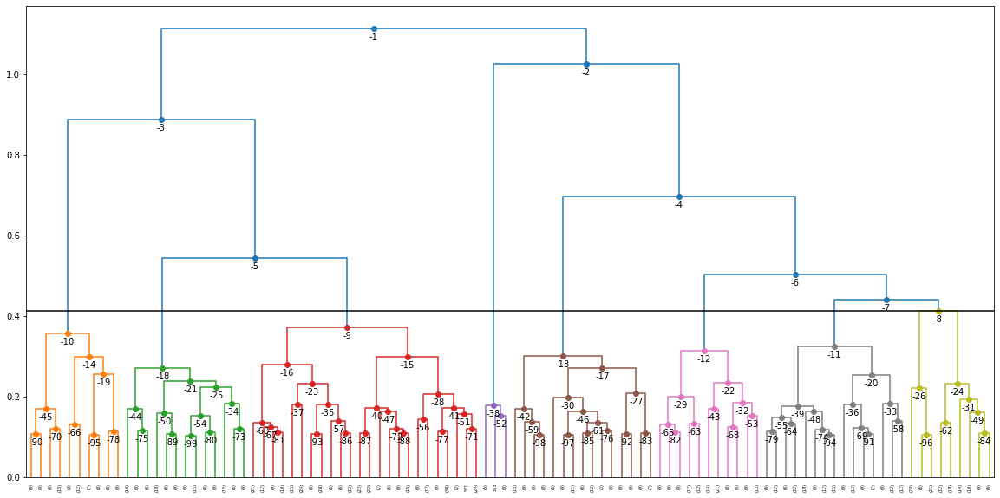

In [12]:
distance_threshold=None
n_clusters=8

model = AgglomerativeClustering(n_clusters=n_clusters, distance_threshold=distance_threshold, affinity='euclidean', linkage='ward')

y_predict = model.fit_predict(X)

plt.figure()
tsne3d(X, labels = y_predict)
plt.show()
umap3d(X, y_predict)
plot_dendrogram(model=model, X=X, truncate_mode='lastp', p=100, 
                n_clusters=n_clusters, 
                color_threshold=distance_threshold)

## Incidence matrix, similarity matrix and correlation

We can then make a first visual inspection of our clusters by looking at the incidence matrix (which will be equal to one if two points belong to the same cluster and 0 if not) and the similarity matrix (which computes the similarity between two points) of our model. They can then be related by computing the correlation score.

In [13]:
def incidence_mat(y_pred):
    npoints = y_pred.shape[0]
    mat = np.zeros([npoints, npoints])
    
    clusters = np.unique(y_pred)
    nclusters = clusters.shape[0]
    
    for i in range(nclusters):
        sample_idx = np.where(y_pred == i)
        
        xx, yy = np.meshgrid(sample_idx, sample_idx) 
        mat[xx, yy] = 1
        
    return mat

def similarity_mat(X, metric):
    dist_mat = pairwise_distances(X, metric=metric)
    min_dist, max_dist = dist_mat.min(), dist_mat.max()
    
    sim_mat = 1 - (dist_mat - min_dist) / (max_dist - min_dist)
    return sim_mat

def correlation(X, y_pred, metric):
    inc = incidence_mat(y_pred)
    sim = similarity_mat(X, metric)
    
    inc = normalize(inc.reshape(1,-1))
    sim = normalize(sim.reshape(1,-1))
    corr = inc @ sim.T 
    return corr[0,0]   

We can see that our correlation is higher than the one obtained with a random clustering.

In [14]:
correlation(X, y_predict, 'euclidean')

0.44687570378483066

In [15]:
y_rand = np.random.randint(0, n_clusters, Y.shape[0])
correlation(X, y_rand, 'euclidean')

0.3532101007506588

We can then look at the matrixes and we can see that in the similarity matrix we obtain some structures along the diagonal, more or less corresponding to the ones that can be seen in the incidence one.

In [16]:
def sorted_mat(sim, y_pred):
    idx_sorted = np.argsort(y_pred)
    sim = sim[idx_sorted, :]
    sim = sim[:, idx_sorted]
    
    return sim

def plot_sorted_mat(sim, y_pred):
    sim = sorted_mat(sim, y_pred)
    
    fig, ax = plt.subplots(figsize=(40,30))  
    ax = sns.heatmap(sim, ax=ax)
    ax.set_yticks([]) 
    ax.set_xticks([])

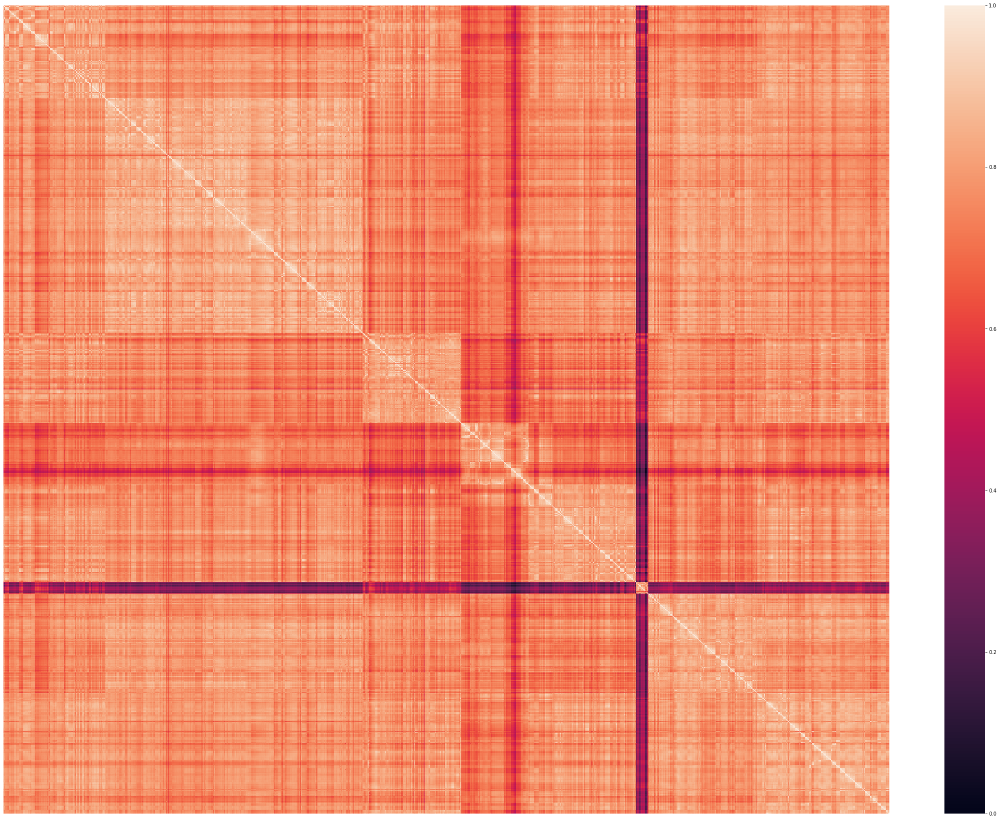

In [17]:
sim = similarity_mat(X, 'euclidean')
plot_sorted_mat(sim, y_predict)

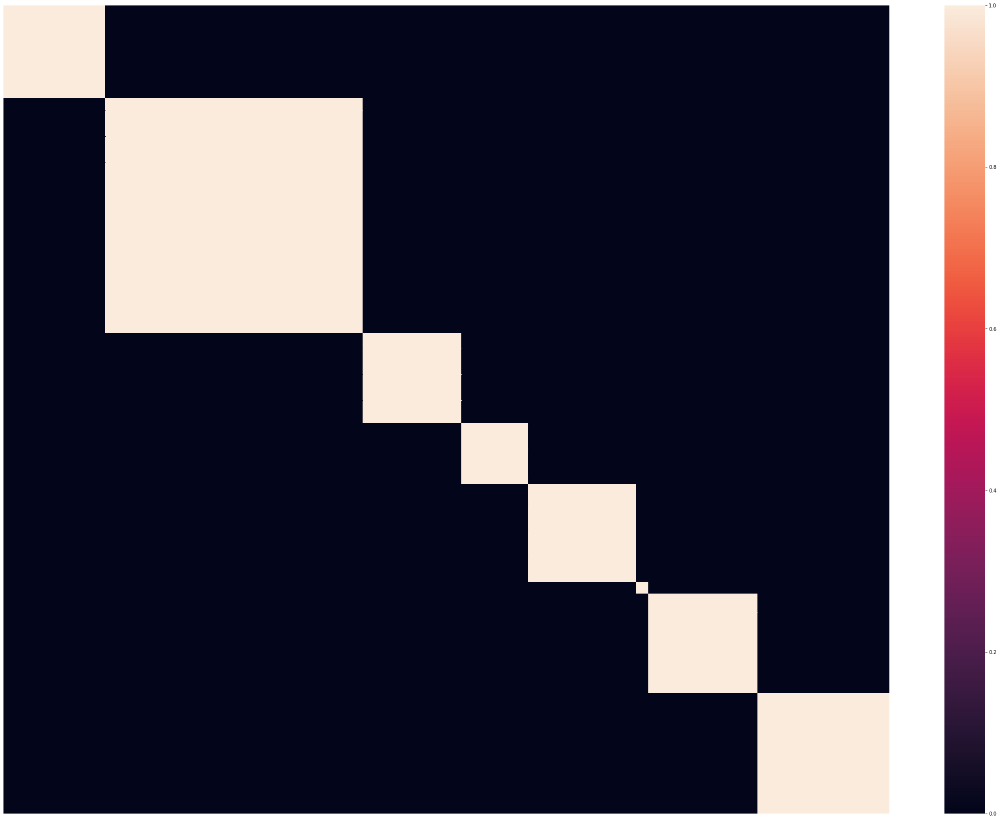

In [18]:
inc = incidence_mat(y_predict)
plot_sorted_mat(inc, y_predict)

## Internal scores first analysis

We can then compute two other internal scores that are indexes for the goodness of our data: the WSS (Within Structural Similarity or cohesion) and the BSS (Between Structural Similarity or separation). The higher the WSS and the lower the BSS the better.

In [19]:
def wss(X, y_pred, metric):
    inc = incidence_mat(y_pred)
    
    dist_mat = pairwise_distances(X, metric=metric)
    
    dist_mat = dist_mat * inc
    
    triu_idx = np.triu_indices(X.shape[0], k=1)
    
    wss = (dist_mat[triu_idx] ** 2).sum()
    
    return wss

def bss(X, y_pred, metric):
    
    inc = incidence_mat(y_pred)
    
    dist_mat = pairwise_distances(X, metric=metric)
    
    dist_mat = dist_mat * (1 - inc)
    
    triu_idx = np.triu_indices(X.shape[0], k=1)
    
    bss = (dist_mat[triu_idx] ** 2).sum()
    
    return bss

print("WSS", wss(X, y_predict, 'euclidean'))
print("BSS", bss(X, y_predict, 'euclidean'))

WSS 353.55245802762835
BSS 4181.243580479309


We can then look at the silhouette score plot, which is a sort of summary of the previously mentioned indexes and in the plot the maximum corresponds to the best number of clusters. Here we can see that it is 4.

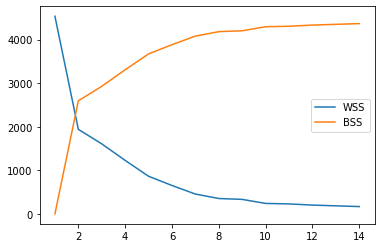

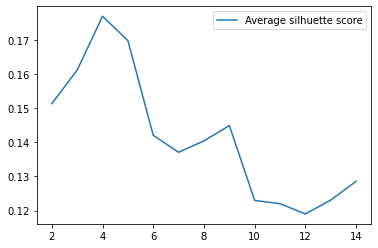

In [20]:
wss_list, bss_list, sil_list = [], [], []
clus_list = list(range(1, 15))

for nc in clus_list:
    model = AgglomerativeClustering(n_clusters=nc,
                                    affinity='euclidean', 
                                    linkage='ward')

    y_predict = model.fit_predict(X)
    
    wss_list.append(wss(X, y_predict, 'euclidean'))
    bss_list.append(bss(X, y_predict, 'euclidean'))
    if nc > 1:
        sil_list.append(silhouette_score(X, y_predict, metric='euclidean'))
    
plt.plot(clus_list, wss_list, label='WSS')
plt.plot(clus_list, bss_list, label='BSS')
plt.legend()
plt.show()

plt.plot(clus_list[1:], sil_list, label='Average silhuette score')
plt.legend()

We can look at the dendrogram with 4 clusters.

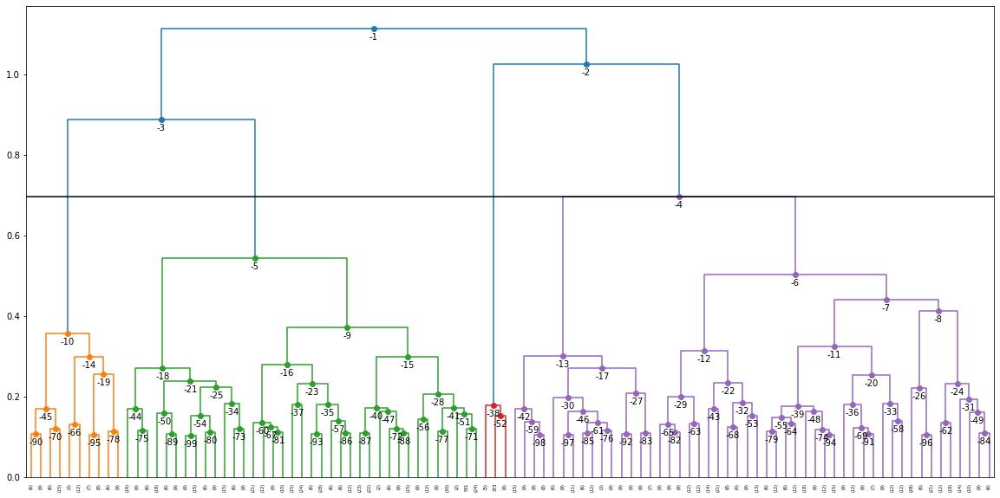

In [21]:
Z = linkage(X, metric='euclidean', method='ward')
fig, ax = plot_dendrogram(Z=Z, X=X, truncate_mode='lastp', 
                          p=100, n_clusters=4)

## External scores first analysis

We can then compute the purity score of our clustering, which considers the percentage of the class that has the maximum percentage in a cluster. We can then consider the purity of an overall clustering method.

In [22]:
def purity_score(y_true, y_pred):
    
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)
    
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

We can see that our purity score is much better than the one obtained after a random model.

In [23]:
purity_score(Y, y_predict)

0.5134633240482822

In [24]:
purity_score(Y, y_rand)

0.17827298050139276

## Internal scorings in depth analysis

We can then perform and in depth analysis of all possible internal scores that describe our clustering methods and might allow us to identify the best one. The scorings that we took in consideration are the distorsion, the correlation and the silhouette.

We have first to get the best number of clusters, based on this scorings.

Random clustering 



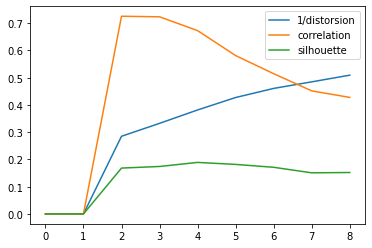

K-means++ clustering 



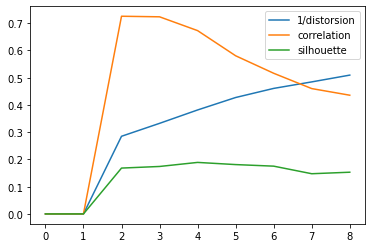

Hierarchical+Kmeans clustering 



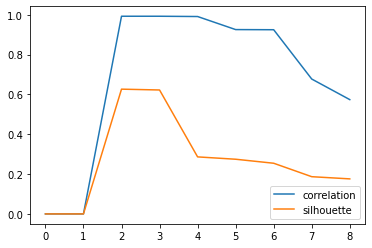

K-medoids clustering 



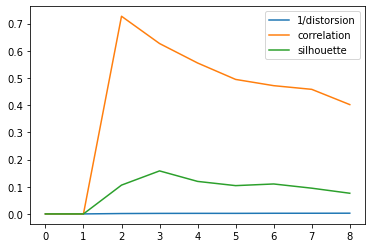

Agglomerative clustering 



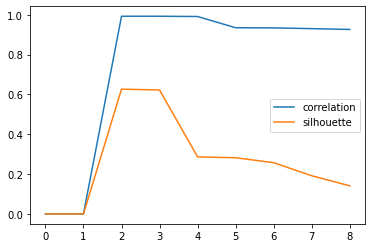

In [25]:
# Random clustering

distorsion_scores = [0,0]
correlation_scores = [0,0]
silhouette_scores = [0,0]

for num_clusters in range(2,9):
    r_kmeans = KMeans(n_clusters=num_clusters, init='random', random_state=0)             
    distorsion_scores.append(1/(r_kmeans.fit(X).inertia_))
    correlation_scores.append(correlation(X, r_kmeans.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, r_kmeans.fit_predict(X), metric = 'euclidean'))

print('Random clustering \n')

plt.figure()

plt.plot(distorsion_scores, label = '1/distorsion')

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# K-means ++

distorsion_scores = [0,0]
correlation_scores = [0,0]
silhouette_scores = [0,0]

for num_clusters in range(2,9):
    kmeans_plus = KMeans(n_clusters=num_clusters, init='k-means++', random_state=0)          
    distorsion_scores.append(1/(kmeans_plus.fit(X).inertia_))
    correlation_scores.append(correlation(X, kmeans_plus.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, kmeans_plus.fit_predict(X), metric = 'euclidean'))

print('K-means++ clustering \n')

plt.figure()

plt.plot(distorsion_scores, label = '1/distorsion')

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# Hierarchical+Kmeans

correlation_scores = [0,0]
silhouette_scores = [0,0]

for num_clusters in range(2,9):
    hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                     distance_threshold=distance_threshold, 
                                     affinity='euclidean', linkage='average')
    y_predict = hmodel.fit_predict(X)
    centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
    hmodel = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0) 
    correlation_scores.append(correlation(X, hmodel.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, hmodel.fit_predict(X), metric = 'euclidean'))

print('Hierarchical+Kmeans clustering \n')

plt.figure()

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# K-medoids clustering

distorsion_scores = [0,0]
correlation_scores = [0,0]
silhouette_scores = [0,0]

for num_clusters in range(2,9):
    k_medoids = KMedoids(n_clusters=num_clusters, metric='correlation', method='alternate', init='heuristic', max_iter=300, random_state=None)
    distorsion_scores.append(1/(k_medoids.fit(X).inertia_))
    correlation_scores.append(correlation(X, k_medoids.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, k_medoids.fit_predict(X), metric = 'euclidean'))

print('K-medoids clustering \n')

plt.figure()

plt.plot(distorsion_scores, label = '1/distorsion')

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# Agglomerative clustering

correlation_scores = [0,0]
silhouette_scores = [0,0]

for num_clusters in range(2,9):
    agglo = AgglomerativeClustering(n_clusters=num_clusters, distance_threshold=distance_threshold, affinity='euclidean', linkage='average')
    correlation_scores.append(correlation(X, agglo.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, agglo.fit_predict(X), metric = 'euclidean'))

print('Agglomerative clustering \n')

plt.figure()

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

With internal clustering metrice we always get that the best cluster number is 2, but this is probably not the right number of clusters given our problem. We decided to stick with 8, which is the number of classes. Indeed, given that we know the number of classes in which we can split our data, external scorings might be better to evaluate the number of clusters (in particular, if we have to merge two clusters or not, without going above 8). The only exception is the agglomerative clustering, in which we have a very high correlation also when increasing the number of clusters, but the maximum silhouette is still with 2 or 3 clusters.

### Distance and linkage choice

We can also check the best distance and linkage, based on the internal scorings.

Hierarchical+Kmeans clustering 



<ipython-input-26-8482c7ee5f4c>:35: UserWarning:

FixedFormatter should only be used together with FixedLocator



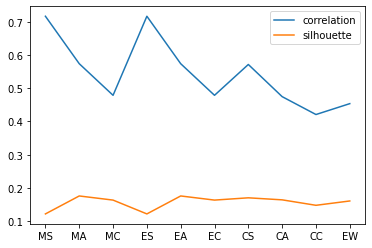

K-medoids clustering 



<ipython-input-26-8482c7ee5f4c>:65: UserWarning:

FixedFormatter should only be used together with FixedLocator



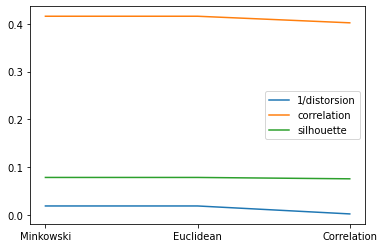

Agglomerative clustering 



<ipython-input-26-8482c7ee5f4c>:105: UserWarning:

FixedFormatter should only be used together with FixedLocator



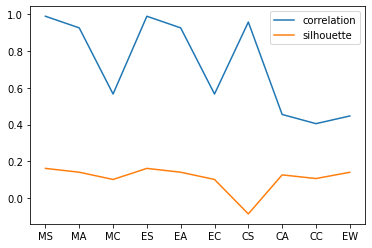

In [26]:
# Hierarchical+Kmeans

distorsion_scores = []
correlation_scores = []
silhouette_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    for linkage in ['single', 'average', 'complete']:
        hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                     distance_threshold=distance_threshold, 
                                     affinity=metric, linkage=linkage)
        y_predict = hmodel.fit_predict(X)
        centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
        hmodel = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0) 
        correlation_scores.append(correlation(X, hmodel.fit_predict(X), metric = 'euclidean'))
        silhouette_scores.append(silhouette_score(X, hmodel.fit_predict(X), metric = 'euclidean'))

hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                distance_threshold=distance_threshold, 
                                 affinity='euclidean', linkage='ward')
y_predict = hmodel.fit_predict(X)
centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
hmodel = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0) 
correlation_scores.append(correlation(X, hmodel.fit_predict(X), metric = 'euclidean'))
silhouette_scores.append(silhouette_score(X, hmodel.fit_predict(X), metric = 'euclidean'))
        
print('Hierarchical+Kmeans clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=11)

labels = ['-', 'MS','MA', 'MC', 'ES', 'EA', 'EC', 'CS', 'CA', 'CC', 'EW']

ax.set_xticklabels(labels)

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# K-medoids clustering

distorsion_scores = []
correlation_scores = []
silhouette_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    k_medoids = KMedoids(n_clusters=num_clusters, metric=metric, method='alternate', init='heuristic', max_iter=300, random_state=None)
    distorsion_scores.append(1/(k_medoids.fit(X).inertia_))
    correlation_scores.append(correlation(X, k_medoids.fit_predict(X), metric = 'euclidean'))
    silhouette_scores.append(silhouette_score(X, k_medoids.fit_predict(X), metric = 'euclidean'))

print('K-medoids clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=4)

labels = ['-', 'Minkowski','Euclidean', 'Correlation']

ax.set_xticklabels(labels)

plt.plot(distorsion_scores, label = '1/distorsion')

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

# Agglomerative clustering

distorsion_scores = []
correlation_scores = []
silhouette_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    for linkage in ['single', 'average', 'complete']:
        agglo = AgglomerativeClustering(n_clusters=num_clusters, 
                                     distance_threshold=distance_threshold, 
                                     affinity=metric, linkage=linkage)
        correlation_scores.append(correlation(X, agglo.fit_predict(X), metric = 'euclidean'))
        silhouette_scores.append(silhouette_score(X, agglo.fit_predict(X), metric = 'euclidean'))

agglo = AgglomerativeClustering(n_clusters=num_clusters, 
                                distance_threshold=distance_threshold, 
                                affinity='euclidean', linkage='ward')
correlation_scores.append(correlation(X, agglo.fit_predict(X), metric = 'euclidean'))
silhouette_scores.append(silhouette_score(X, agglo.fit_predict(X), metric = 'euclidean'))
        
print('Agglomerative clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=11)

labels = ['-', 'MS','MA', 'MC', 'ES', 'EA', 'EC', 'CS', 'CA', 'CC', 'EW']

ax.set_xticklabels(labels)

plt.plot(correlation_scores, label = 'correlation')

plt.plot(silhouette_scores, label = 'silhouette')

plt.legend()

plt.show()

We can see that in general euclidean metric with avearge linkage works for Hierarchical+Kmeans, while for K-medoids the euclidean metric is better as a metric and lastly that for the agglomerative clustering the best model might be the one with average linkage and euclidean metric, because the single linkage leads to a very low silhouette and we could see from the dendrogram that it could be problematic. We will then have to see if this parameters are confirmed when considering external scorings.

We can now compute the actual scorings.

In [27]:
num_clusters = 8

# Random
model = KMeans(n_clusters=num_clusters, init='random', random_state=0)
print("Random Kmeans distorsion", model.fit(X).inertia_)
print("Random Kmeans correlation", correlation(X, model.fit_predict(X), metric = 'euclidean'))
print("Random Kmeans silhouette", silhouette_score(X, model.fit_predict(X), metric='euclidean'))

print('\n')

# K-Means++
model = KMeans(n_clusters=num_clusters, init='k-means++', random_state=0)
print("Kmeans++ distorsion", model.fit(X).inertia_)
print("Kmeans++ correlation",  correlation(X, model.fit_predict(X), metric = 'euclidean'))
print("Kmeans++ silhouette", silhouette_score(X, model.fit_predict(X), metric='euclidean'))

print('\n')

# Hierarchical
hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                 distance_threshold=distance_threshold, 
                                 affinity='euclidean', linkage='average')
y_predict = hmodel.fit_predict(X)
centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
model = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0)
print("Hierarchical+Kmeans distorsion", model.fit(X).inertia_)
print("Hierarchical+Kmeans correlation",  correlation(X, model.fit_predict(X), metric = 'euclidean'))
print("Hierarchical+Kmeans silhouette", silhouette_score(X, model.fit_predict(X), metric='euclidean'))

print('\n')

# K-medoids
model = KMedoids(n_clusters=num_clusters, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
print("K-medoids distorsion", model.fit(X).inertia_)
print("K-medoids correlation",  correlation(X, model.fit_predict(X), metric = 'euclidean'))
print("K-medoids silhouette", silhouette_score(X, model.fit_predict(X), metric='euclidean'))

print('\n')

# Agglomerative
model = AgglomerativeClustering(n_clusters=num_clusters, distance_threshold=distance_threshold, affinity='euclidean', linkage='average')
y_predict = model.fit_predict(X)
print("Agglomerative correlation",  correlation(X, y_predict, metric = 'euclidean'))
print("Agglomerative silhouette", silhouette_score(X, model.fit_predict(X), metric='euclidean'))

Random Kmeans distorsion 1.9639601955126844
Random Kmeans correlation 0.4275685627536515
Random Kmeans silhouette 0.15199088692703924


Kmeans++ distorsion 1.963159648922789
Kmeans++ correlation 0.4355876514100668
Kmeans++ silhouette 0.1530404630612542


Hierarchical+Kmeans distorsion 2.308267449675799
Hierarchical+Kmeans correlation 0.5738831622275129
Hierarchical+Kmeans silhouette 0.17593178289016403


K-medoids distorsion 51.971481517244975
K-medoids correlation 0.41559820840851264
K-medoids silhouette 0.07882856829727032


Agglomerative correlation 0.9262069918461391
Agglomerative silhouette 0.14084596915482783


We can see that the agglomerative algorithm, for which we cannot compute the distorsion, has a very high correlation, close to 1. All the other models have a correlation close to 0.4-0.5. The worst model seems to be K-medoids, which has the lowest correlation and silhouette and the highest distorsion.

## External scorings in depth analysis

We then have to check the best external scorings, which, based on our problem and the fact that we already know the number of classes that we want to predict and their labels, might be more meaningful to consider.

We first have to define the entropy score function, which consider the precision of each class in a cluster and its logarithm, multiplied and summed for all classes in a cluster. Then computes the entropy of the clustering method by a weighted sum of the entropy of each cluster.

In [28]:
def entropy_score(y_true, y_predict):

    df = pd.DataFrame(y_predict)

    df['Effective'] = y_true

    df['Predicted'] = y_predict

    df = df.drop(0, axis = 1)

    new_df = pd.DataFrame(df.groupby(['Predicted', 'Effective']).size().unstack(fill_value=0).stack())

    new_df['Frequency'] = (new_df[0] / list(np.repeat(new_df.groupby(['Predicted'])[0].sum(), 8))) + 1e-8

    new_df['logF'] = np.log2(new_df['Frequency'])

    new_df['Product'] = new_df['logF'] * new_df['Frequency']

    cluster_entropy = new_df.groupby(['Predicted'])['Product'].sum() * (-1)

    total = sum(new_df.groupby(['Predicted'])[0].sum())

    cluster_size = new_df.groupby(['Predicted'])[0].sum()

    entropy = sum((cluster_entropy * cluster_size)/total)

    return entropy

We have to determine the best number of clusters based on external scorings.

Random clustering 



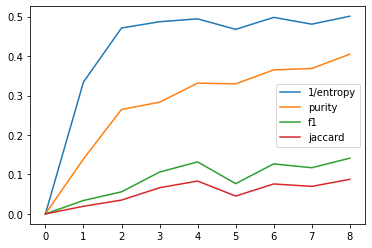

K-means++ clustering 



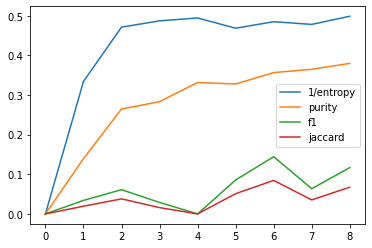

Hierarchical+Kmeans clustering 



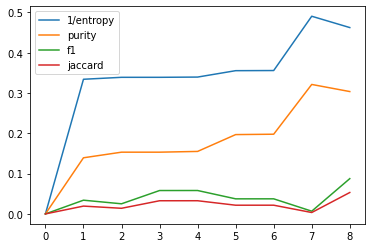

K-medoids clustering 



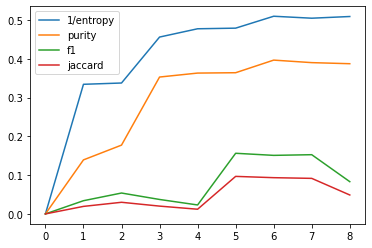

Agglomerative clustering 



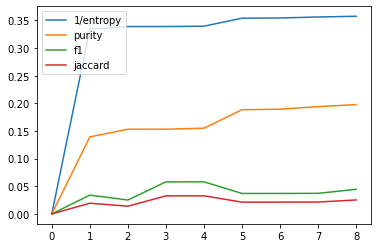

In [29]:
# Random clustering

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    r_kmeans = KMeans(n_clusters=num_clusters, init='random', random_state=0)             
    entropy_scores.append(1/(entropy_score(Y, r_kmeans.fit_predict(X))))
    purity_scores.append(purity_score(Y, r_kmeans.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, r_kmeans.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, r_kmeans.fit_predict(X), average = 'weighted'))

print('Random clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# K-means ++

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    kmeans_plus = KMeans(n_clusters=num_clusters, init='k-means++', random_state=0)    
    entropy_scores.append(1/(entropy_score(Y, kmeans_plus.fit_predict(X))))
    purity_scores.append(purity_score(Y, kmeans_plus.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, kmeans_plus.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, kmeans_plus.fit_predict(X), average = 'weighted'))

print('K-means++ clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# Hierarchical+Kmeans

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                     distance_threshold=distance_threshold, 
                                     affinity='euclidean', linkage='average')
    y_predict = hmodel.fit_predict(X)
    centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
    hmodel = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0)    
    entropy_scores.append(1/(entropy_score(Y, hmodel.fit_predict(X))))
    purity_scores.append(purity_score(Y, hmodel.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, hmodel.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, hmodel.fit_predict(X), average = 'weighted'))

print('Hierarchical+Kmeans clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# K-medoids clustering

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    k_medoids = KMedoids(n_clusters=num_clusters, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
    entropy_scores.append(1/(entropy_score(Y, k_medoids.fit_predict(X))))
    purity_scores.append(purity_score(Y, k_medoids.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, k_medoids.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, k_medoids.fit_predict(X), average = 'weighted'))

print('K-medoids clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()
plt.show()

# Agglomerative clustering

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    agglo = AgglomerativeClustering(n_clusters=num_clusters, distance_threshold=distance_threshold, affinity='euclidean', linkage='average')
    entropy_scores.append(1/(entropy_score(Y, agglo.fit_predict(X))))
    purity_scores.append(purity_score(Y, agglo.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, agglo.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, agglo.fit_predict(X), average = 'weighted'))

print('Agglomerative clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

It seems that the overall best model might be between 6 and 8 clusters, but we will consider for each method the best number of clusters.

### Distance and linkage choice

We then have to determine the best distance and linkage parameters based on external scorings.

Hierarchical+Kmeans clustering 



<ipython-input-30-60acf0bf2a9b>:43: UserWarning:

FixedFormatter should only be used together with FixedLocator



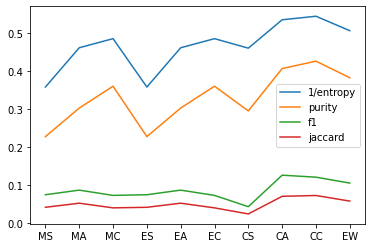

K-medoids clustering 



<ipython-input-30-60acf0bf2a9b>:79: UserWarning:

FixedFormatter should only be used together with FixedLocator



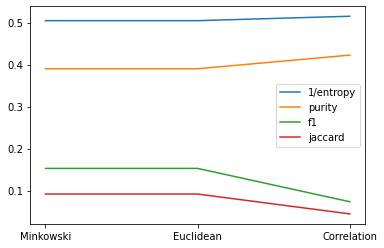

Agglomerative clustering 



<ipython-input-30-60acf0bf2a9b>:125: UserWarning:

FixedFormatter should only be used together with FixedLocator



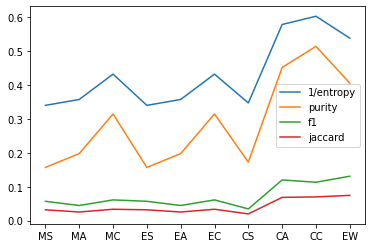

In [30]:
# Hierarchical+Kmeans

entropy_scores = []
f1_scores = []
purity_scores = []
jaccard_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    for linkage in ['single', 'average', 'complete']:
        hmodel = AgglomerativeClustering(n_clusters=8, 
                                         distance_threshold=distance_threshold, 
                                         affinity=metric, linkage=linkage)
            
        y_predict = hmodel.fit_predict(X)
        centroids = np.stack([X[y_predict==k].mean(0) for k in range(8)])
        hmodel = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=0) 
        entropy_scores.append(1/(entropy_score(Y, hmodel.fit_predict(X))))
        purity_scores.append(purity_score(Y, hmodel.fit_predict(X)))
        jaccard_scores.append(jaccard_score(Y, hmodel.fit_predict(X), average = 'weighted'))
        f1_scores.append(f1_score(Y, hmodel.fit_predict(X), average = 'weighted'))

hmodel = AgglomerativeClustering(n_clusters=8, 
                                         distance_threshold=distance_threshold, 
                                         affinity='euclidean', linkage='ward')
            
y_predict = hmodel.fit_predict(X)
centroids = np.stack([X[y_predict==k].mean(0) for k in range(8)])
hmodel = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=0)

entropy_scores.append(1/(entropy_score(Y, hmodel.fit_predict(X))))
purity_scores.append(purity_score(Y, hmodel.fit_predict(X)))
jaccard_scores.append(jaccard_score(Y, hmodel.fit_predict(X), average = 'weighted'))
f1_scores.append(f1_score(Y, hmodel.fit_predict(X), average = 'weighted'))
        
print('Hierarchical+Kmeans clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=11)

labels = ['-', 'MS','MA', 'MC', 'ES', 'EA', 'EC', 'CS', 'CA', 'CC', 'EW']

ax.set_xticklabels(labels)

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# K-medoids clustering

entropy_scores = []
f1_scores = []
purity_scores = []
jaccard_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    k_medoids = KMedoids(n_clusters=7, metric=metric, method='alternate', init='heuristic', max_iter=300, random_state=None)
    entropy_scores.append(1/(entropy_score(Y, k_medoids.fit_predict(X))))
    purity_scores.append(purity_score(Y, k_medoids.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, k_medoids.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, k_medoids.fit_predict(X), average = 'weighted'))

print('K-medoids clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=4)

labels = ['-', 'Minkowski','Euclidean', 'Correlation']

ax.set_xticklabels(labels)

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# Agglomerative clustering

entropy_scores = []
f1_scores = []
purity_scores = []
jaccard_scores = []

for metric in ['minkowski', 'euclidean', 'correlation']:
    for linkage in ['single', 'average', 'complete']:
        agglo = AgglomerativeClustering(n_clusters=8, 
                                     distance_threshold=distance_threshold, 
                                     affinity=metric, linkage=linkage)
        
        entropy_scores.append(1/(entropy_score(Y, agglo.fit_predict(X))))
        purity_scores.append(purity_score(Y, agglo.fit_predict(X)))
        jaccard_scores.append(jaccard_score(Y, agglo.fit_predict(X), average = 'weighted'))
        f1_scores.append(f1_score(Y, agglo.fit_predict(X), average = 'weighted'))
        
agglo = AgglomerativeClustering(n_clusters=8, distance_threshold=distance_threshold, affinity='euclidean', linkage = 'ward')
entropy_scores.append(1/(entropy_score(Y, agglo.fit_predict(X))))
purity_scores.append(purity_score(Y, agglo.fit_predict(X)))
jaccard_scores.append(jaccard_score(Y, agglo.fit_predict(X), average = 'weighted'))
f1_scores.append(f1_score(Y, agglo.fit_predict(X), average = 'weighted'))

print('Agglomerative clustering \n')

fig, ax = plt.subplots()

plt.locator_params(axis="x", nbins=11)

labels = ['-', 'MS','MA', 'MC', 'ES', 'EA', 'EC', 'CS', 'CA', 'CC', 'EW']

ax.set_xticklabels(labels)

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

We can now see that we don't get the same best parameters as when considering the internal scores. This time, the complete linkage with the correlation distance seems to be the best for both Hierarchical+Kmeans and for agglomerative clustering, and also for K-medoids, the best distance seems to be the euclidean one overall. Since we are in a context in which we know the classes that we want to predict, the external scorings should be the ones that we privilege, so we will continue with this models.

We might want to check again the number of clusters with the new parameters.

Hierarchical+Kmeans clustering 



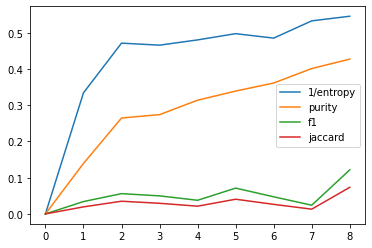

K-medoids clustering 



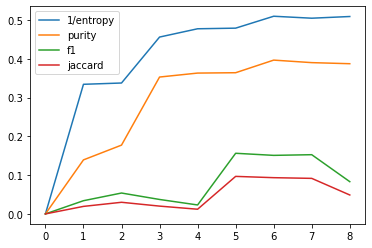

Agglomerative clustering 



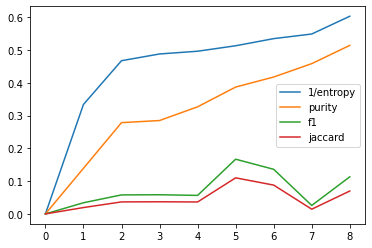

In [31]:
# Hierarchical+Kmeans

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    hmodel = AgglomerativeClustering(n_clusters=num_clusters, 
                                     distance_threshold=distance_threshold, 
                                     affinity='correlation', linkage='complete')
    y_predict = hmodel.fit_predict(X)
    centroids = np.stack([X[y_predict==k].mean(0) for k in range(num_clusters)])
    hmodel = KMeans(n_clusters=num_clusters, init=centroids, n_init=1, random_state=0)    
    entropy_scores.append(1/(entropy_score(Y, hmodel.fit_predict(X))))
    purity_scores.append(purity_score(Y, hmodel.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, hmodel.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, hmodel.fit_predict(X), average = 'weighted'))

print('Hierarchical+Kmeans clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

# K-medoids clustering

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    k_medoids = KMedoids(n_clusters=num_clusters, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
    entropy_scores.append(1/(entropy_score(Y, k_medoids.fit_predict(X))))
    purity_scores.append(purity_score(Y, k_medoids.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, k_medoids.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, k_medoids.fit_predict(X), average = 'weighted'))

print('K-medoids clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()
plt.show()

# Agglomerative clustering

entropy_scores = [0]
f1_scores = [0]
purity_scores = [0]
jaccard_scores = [0]

for num_clusters in range(1,9):
    agglo = AgglomerativeClustering(n_clusters=num_clusters, distance_threshold=distance_threshold, affinity='correlation', linkage='complete')
    entropy_scores.append(1/(entropy_score(Y, agglo.fit_predict(X))))
    purity_scores.append(purity_score(Y, agglo.fit_predict(X)))
    jaccard_scores.append(jaccard_score(Y, agglo.fit_predict(X), average = 'weighted'))
    f1_scores.append(f1_score(Y, agglo.fit_predict(X), average = 'weighted'))

print('Agglomerative clustering \n')

plt.figure()

plt.plot(entropy_scores, label = '1/entropy')

plt.plot(purity_scores, label = 'purity')

plt.plot(f1_scores, label = 'f1')

plt.plot(jaccard_scores, label = 'jaccard')

plt.legend()

plt.show()

We can see that the best number of clusters is 8 for Hierarchical+K-means and 7 for K-medoids.

We can now compute the actual scorings.

In [32]:
# Random
r_kmeans = KMeans(n_clusters=8, init='random', random_state=0)             
print("Random Kmeans purity", purity_score(Y, r_kmeans.fit_predict(X)))
print("Random Kmeans f-score", f1_score(Y, r_kmeans.fit_predict(X), average = 'weighted'))
print("Random Kmeans Jaccard similarity", jaccard_score(Y, r_kmeans.fit_predict(X), average = 'weighted'))
print("Random Kmeans 1/entropy", 1/(entropy_score(Y, r_kmeans.fit_predict(X))))

print('\n')

# K-Means++
kmeans_plus = KMeans(n_clusters=6, init='k-means++', random_state=0)             
print("Kmeans++ purity", purity_score(Y, kmeans_plus.fit_predict(X)))
print("Kmeans++ f-score", f1_score(Y, kmeans_plus.fit_predict(X), average = 'weighted'))
print("Kmeans++ Jaccard similarity", jaccard_score(Y, kmeans_plus.fit_predict(X), average = 'weighted'))
print("Kmeans++ 1/entropy", 1/(entropy_score(Y, kmeans_plus.fit_predict(X))))

print('\n')

# Hierarchical+Kmeans
hmodel = AgglomerativeClustering(n_clusters=8, 
                                 distance_threshold=distance_threshold, 
                                 affinity='euclidean', linkage='ward')
y_predict = hmodel.fit_predict(X)
centroids = np.stack([X[y_predict==k].mean(0) for k in range(8)])
hmodel = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=0)            
print("Hierarchical+Kmeans purity", purity_score(Y, hmodel.fit_predict(X)))
print("Hierarchical+Kmeans f-score", f1_score(Y, hmodel.fit_predict(X), average = 'weighted'))
print("Hierarchical+Kmeans Jaccard similarity", jaccard_score(Y, hmodel.fit_predict(X), average = 'weighted'))
print("Hierarchical+Kmeans 1/entropy", 1/(entropy_score(Y, hmodel.fit_predict(X))))

print('\n')

# K-medoids
k_medoids = KMedoids(n_clusters=7, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
print("K-medoids purity", purity_score(Y, k_medoids.fit_predict(X)))
print("K-medoids f-score", f1_score(Y, k_medoids.fit_predict(X), average = 'weighted'))
print("K-medoids Jaccard similarity", jaccard_score(Y, k_medoids.fit_predict(X), average = 'weighted'))
print("K-medoids 1/entropy", 1/(entropy_score(Y, k_medoids.fit_predict(X))))

print('\n')

# Agglomerative
agglo = AgglomerativeClustering(n_clusters=8, distance_threshold=distance_threshold, affinity='euclidean', linkage='ward')
print("Agglomerative purity", purity_score(Y, agglo.fit_predict(X)))
print("Agglomerative f-score", f1_score(Y, agglo.fit_predict(X), average = 'weighted'))
print("Agglomerative Jaccard similarity", jaccard_score(Y, agglo.fit_predict(X), average = 'weighted'))
print("Agglomerative 1/entropy", 1/(entropy_score(Y, agglo.fit_predict(X))))


Random Kmeans purity 0.40482822655524603
Random Kmeans f-score 0.14123532893969032
Random Kmeans Jaccard similarity 0.08760769907412629
Random Kmeans 1/entropy 0.5009743460367958


Kmeans++ purity 0.3565459610027855
Kmeans++ f-score 0.14427540520918244
Kmeans++ Jaccard similarity 0.08446573091765917
Kmeans++ 1/entropy 0.4849260072729327


Hierarchical+Kmeans purity 0.38347260909935005
Hierarchical+Kmeans f-score 0.10610747361292866
Hierarchical+Kmeans Jaccard similarity 0.05866498176769531
Hierarchical+Kmeans 1/entropy 0.5074015914649225


K-medoids purity 0.38997214484679665
K-medoids f-score 0.15265338236369397
K-medoids Jaccard similarity 0.0916254045422038
K-medoids 1/entropy 0.5044935347387141


Agglomerative purity 0.40575673166202414
Agglomerative f-score 0.13100775688388483
Agglomerative Jaccard similarity 0.07441243590230286
Agglomerative 1/entropy 0.5386709537924006


### Remove outliers

We might want to remove outliers of the distribution and check if the purity of our clusters increases.

In [33]:
def detect_outlier(data_1):
    outliers = []
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)  
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y)
    return outliers

mp_data_no = mp_data.copy()

for x in mp_data.columns:
    if x != 'Class':
        outliers=detect_outlier(mp_data[x])
        nas = []
        for el in mp_data[x]:
            nas.append(el in outliers)
            indices = [i for i, x in enumerate(nas) if x == True]
            for ind in indices:
                mp_data_no.at[ind, x] = None

mp_data_no =mp_data_no.dropna()
mp_data_no.shape           

(819, 78)

In [34]:
X_no = mp_data_no[[x for x in mp_data_no.columns if x != 'Class']]
Y_no = mp_data_no[['Class']]

In [35]:
# Random
model = KMeans(n_clusters=6, init='random', random_state=0)             
print("Random Kmeans purity", purity_score(Y_no, model.fit_predict(X_no)))

# K-Means++
model = KMeans(n_clusters=7, init='k-means++', random_state=0)             
print("Kmeans++ purity", purity_score(Y_no, model.fit_predict(X_no)))

# Hierarchical
model = AgglomerativeClustering(n_clusters=8, 
                                 distance_threshold=distance_threshold, 
                                 affinity='euclidean', linkage='ward')
y_predict = model.fit_predict(X_no)
centroids = np.stack([X_no[y_predict==k].mean(0) for k in range(8)])
model = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=0)             
print("Hierarchical+Kmeans purity", purity_score(Y_no, model.fit_predict(X_no)))

# K-medoids
model = KMedoids(n_clusters=8, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)

print("K-medoids purity", purity_score(Y_no, model.fit_predict(X_no)))

# Agglomerative
model = AgglomerativeClustering(n_clusters=8, 
                                distance_threshold=distance_threshold, 
                                affinity='euclidean', linkage='ward')

print('Agglomerative purity', purity_score(Y_no, model.fit_predict(X_no)))

Random Kmeans purity 0.3431013431013431
Kmeans++ purity 0.358974358974359
Hierarchical+Kmeans purity 0.37484737484737485
K-medoids purity 0.43956043956043955
Agglomerative purity 0.3833943833943834


We can see that there is a general decrease, highlighting that the model with all the data might work better. The only one that increases is the K-medoids.

## DBSCAN

We can then try to implement a clustering method which is density based, DBSCAN.

In [36]:
dbscan = DBSCAN(eps=1, min_samples=0)
y_predict = dbscan.fit_predict(X)
print("DBSCAN purity", purity_score(Y, y_predict))

print("Number of outliers", (y_predict == -1).sum())
ids, counts = np.unique(y_predict, return_counts=True)
print(pd.DataFrame(counts.reshape(1,-1), columns=ids)) 

tsne3d(X, labels=y_predict)
umap3d(X, y_predict)

DBSCAN purity 0.1392757660167131
Number of outliers 0
      0
0  1077


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



We can see that the clustering doesn't work properly, and it only finds one big cluster. We can then check if different parameters work better, by tuning them with cross validation.

In [37]:
def make_scorer(metric):
    def scorer(estimator, X, y):
        y_pred = estimator.fit_predict(X)
        return metric(y_pred, y)
    return scorer

In [38]:
params = {'eps': range(1,21,5), 'min_samples': range(0,20,5)}
cv = GridSearchCV(dbscan, params, scoring=make_scorer(purity_score), cv=3)
cv = cv.fit(X,Y)

In [39]:
print(cv.best_params_)
print("CV score", purity_score(Y, cv.best_estimator_.fit_predict(X)))

pd.DataFrame(cv.cv_results_)

{'eps': 1, 'min_samples': 0}
CV score 0.1392757660167131


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_eps,param_min_samples,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,0.042662,6.600341e-03,0.013005,0.000814,1,0,"{'eps': 1, 'min_samples': 0}",1.0,1.0,1.0,1.0,0.0,1
1,0.042332,2.356796e-03,0.010339,0.000474,1,5,"{'eps': 1, 'min_samples': 5}",1.0,1.0,1.0,1.0,0.0,1
2,0.038336,2.056023e-03,0.010334,0.000470,1,10,"{'eps': 1, 'min_samples': 10}",1.0,1.0,1.0,1.0,0.0,1
3,0.038007,8.129351e-04,0.010995,0.000004,1,15,"{'eps': 1, 'min_samples': 15}",1.0,1.0,1.0,1.0,0.0,1
4,0.037001,3.236019e-06,0.010670,0.000942,6,0,"{'eps': 6, 'min_samples': 0}",1.0,1.0,1.0,1.0,0.0,1
5,0.037335,4.735270e-04,0.009342,0.001703,6,5,"{'eps': 6, 'min_samples': 5}",1.0,1.0,1.0,1.0,0.0,1
6,0.037662,1.245728e-03,0.010675,0.000473,6,10,"{'eps': 6, 'min_samples': 10}",1.0,1.0,1.0,1.0,0.0,1
7,0.038670,1.247343e-03,0.011336,0.000470,6,15,"{'eps': 6, 'min_samples': 15}",1.0,1.0,1.0,1.0,0.0,1
8,0.040668,4.109157e-03,0.011333,0.000468,11,0,"{'eps': 11, 'min_samples': 0}",1.0,1.0,1.0,1.0,0.0,1
9,0.037669,1.247150e-03,0.010998,0.000817,11,5,"{'eps': 11, 'min_samples': 5}",1.0,1.0,1.0,1.0,0.0,1


We can see that with every parameter considered the result is the same, meaning that our data cannot be split according to density.

## Summary barplot on internal scorings

We can then produce some summary barplots for the internal scorings across the different models.

Random K-means 1/dispersion score is: 0.5091752889314306
Random K-means correlation score is: 0.4275685627536515
Random K-means silhouette score is: 0.15199088692703924 

K-means++ 1/dispersion score is: 0.4606111919931616
K-means++ correlation score is: 0.5161233898195741
K-means++ silhouette score is: 0.17527611361978912 

K-medoids 1/dispersion score is: 0.0188527295541837
K-medoids correlation score is: 0.42559518366597127
K-medoids silhouette score is: 0.08141908979270662 

Hierarchical+K-means 1/dispersion score is: not determined
Hierarchical+K-means correlation score is: 0.45370057798592733
Hierarchical+K-means silhouette score is: 0.16086684971043547 

Agglomerative 1/dispersion score is: not determined
Agglomerative correlation score is: 0.44687570378483066
Agglomerative silhouette score is: 0.14038223671260244 

DBSCAN 1/dispersion score is: not determined
DBSCAN correlation score is: 0.99184324533663
DBSCAN silhouette score is: not determined 



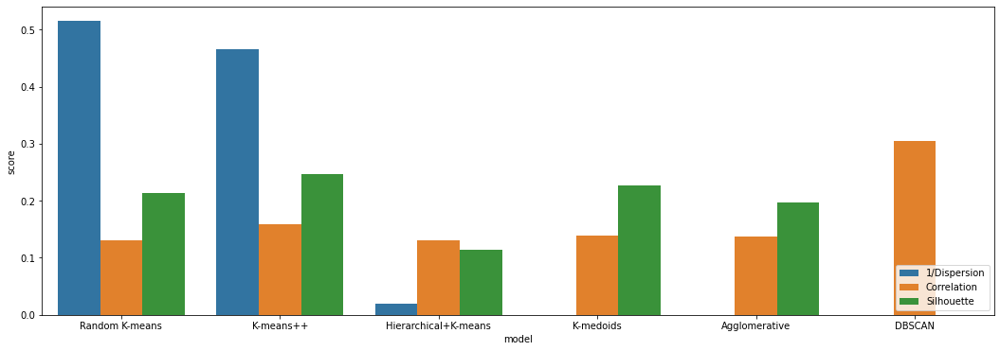

In [40]:
dispersion_scores, correlation_scores, silhouette_scores = [], [], []

for name, model in [('Random K-means', r_kmeans), ('K-means++', kmeans_plus), ('K-medoids', k_medoids)]:
    # dispersion taken as 1/dispersion because all the other scores have higher scores for better clusterings, whereas dispersion would be the contrary
    dispersion_scores.append(1/(model.fit(X).inertia_))
    print(f'{name} 1/dispersion score is: {1/(model.fit(X).inertia_)}')
    correlation_scores.append(correlation(X, model.fit_predict(X), metric = 'euclidean'))
    print(f'{name} correlation score is: {correlation(X, model.fit_predict(X), metric = "euclidean")}')
    silhouette_scores.append(silhouette_score(X, model.fit_predict(X), metric='euclidean'))
    print(f'{name} silhouette score is: {silhouette_score(X, model.fit_predict(X), metric="euclidean")} \n')

for name, model in [('Hierarchical+K-means', hmodel), ('Agglomerative', agglo)]:
    dispersion_scores.append(0)
    print(f'{name} 1/dispersion score is: not determined')
    correlation_scores.append(correlation(X, model.fit_predict(X), metric = 'euclidean'))
    print(f'{name} correlation score is: {correlation(X, model.fit_predict(X), metric = "euclidean")}')
    silhouette_scores.append(silhouette_score(X, model.fit_predict(X), metric='euclidean'))
    print(f'{name} silhouette score is: {silhouette_score(X, model.fit_predict(X), metric="euclidean")} \n')
    
dispersion_scores.append(0)
print(f'DBSCAN 1/dispersion score is: not determined')
correlation_scores.append(correlation(X, dbscan.fit_predict(X), metric = 'euclidean'))
print(f'DBSCAN correlation score is: {correlation(X, dbscan.fit_predict(X), metric = "euclidean")}')
silhouette_scores.append(0)
print(f'DBSCAN silhouette score is: not determined \n')
        
# Standardization for representation purposes
dispersion_scores = [x/sum(dispersion_scores) for x in dispersion_scores]
correlation_scores = [x/sum(correlation_scores) for x in correlation_scores]
silhouette_scores = [x/sum(silhouette_scores) for x in silhouette_scores]


data = pd.DataFrame()
data['model'] =  ['Random K-means', 'K-means++', 'Hierarchical+K-means', 'K-medoids', 'Agglomerative', 'DBSCAN'] * 3
data['metric'] = ['1/Dispersion'] * len(dispersion_scores) + ['Correlation'] * len(correlation_scores) + ['Silhouette'] * len(silhouette_scores) 
data['score'] = dispersion_scores + correlation_scores + silhouette_scores

fig_dims = (18, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='model', y='score', data=data, hue='metric', ax = ax)
plt.legend(loc='lower right')

Based on correlation and silhouette scores, we can see that the best models are random K-means, K-medoids and K-means++. Hirerachical+K-means has the lowest values in all three scores. We can also see that DBSCAN has the highest correlation, but this is due to the fact that it only finds one cluster.

## Summary barplots on external scorings

We can then produce some summary barplots for the external scorings across the different models.

Random K-means purity score is: 0.40482822655524603
Random K-means f1 score is: 0.14123532893969032
Random K-means Jaccard score is: 0.08760769907412629
Random K-means 1/entropy score is: 0.5009743460367958 

K-means++ purity score is: 0.3565459610027855
K-means++ f1 score is: 0.14427540520918244
K-means++ Jaccard score is: 0.08446573091765917
K-means++ 1/entropy score is: 0.4849260072729327 

Hierarchical+Kmeans purity score is: 0.38347260909935005
Hierarchical+Kmeans f1 score is: 0.10610747361292866
Hierarchical+Kmeans Jaccard score is: 0.05866498176769531
Hierarchical+Kmeans 1/entropy score is: 0.5074015914649225 

K-medoids purity score is: 0.38997214484679665
K-medoids f1 score is: 0.15265338236369397
K-medoids Jaccard score is: 0.0916254045422038
K-medoids 1/entropy score is: 0.5044935347387141 

Agglomerative purity score is: 0.40575673166202414
Agglomerative f1 score is: 0.13100775688388483
Agglomerative Jaccard score is: 0.07441243590230286
Agglomerative 1/entropy score is: 0.

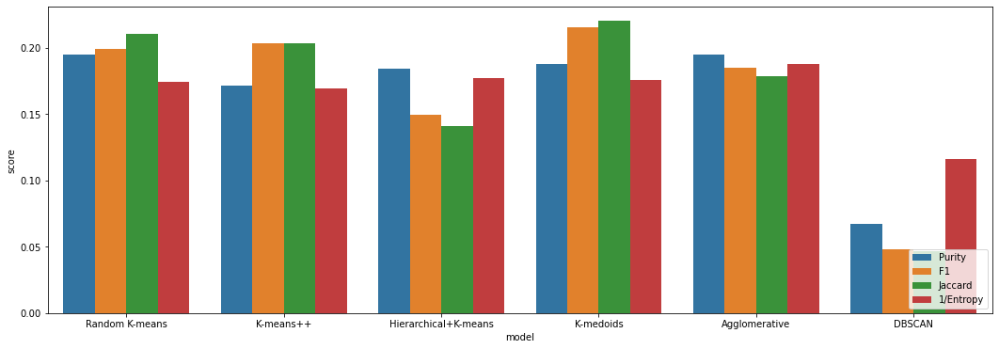

In [41]:
purity_scores, f1_scores, jaccard_scores, entropy_scores = [], [], [], []

for name, model in [('Random K-means', r_kmeans), ('K-means++', kmeans_plus), ('Hierarchical+Kmeans', hmodel),
                    ('K-medoids', k_medoids), ('Agglomerative', agglo), ('DBSCAN', dbscan)]:
        
    purity_scores.append(purity_score(Y, model.fit_predict(X)))
    print(f'{name} purity score is: {purity_score(Y, model.fit_predict(X))}')
    f1_scores.append(f1_score(Y, model.fit_predict(X), average = 'weighted'))
    print(f'{name} f1 score is: {f1_score(Y, model.fit_predict(X), average = "weighted")}')
    jaccard_scores.append(jaccard_score(Y, model.fit_predict(X), average = "weighted"))
    print(f'{name} Jaccard score is: {jaccard_score(Y, model.fit_predict(X), average = "weighted")}')
    # entropy taken as 1/entropy because all the other scores have higher scores for better clusterings, whereas entropy would be the contrary
    entropy_scores.append(1/(entropy_score(Y, model.fit_predict(X))))
    print(f'{name} 1/entropy score is: {1/(entropy_score(Y, model.fit_predict(X)))} \n')

# Standardization for representation purposes
purity_scores = [x/sum(purity_scores) for x in purity_scores]
f1_scores = [x/sum(f1_scores) for x in f1_scores]
jaccard_scores = [x/sum(jaccard_scores) for x in jaccard_scores]
entropy_scores = [x/sum(entropy_scores) for x in entropy_scores]


data = pd.DataFrame()
data['model'] =  ['Random K-means', 'K-means++', 'Hierarchical+K-means', 'K-medoids', 'Agglomerative', 'DBSCAN'] * 4
data['metric'] = ['Purity'] * len(purity_scores) + ['F1'] * len(f1_scores) + ['Jaccard'] * len(jaccard_scores) + ['1/Entropy'] * len(entropy_scores)
data['score'] = purity_scores + f1_scores + jaccard_scores + entropy_scores

fig_dims = (18, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='model', y='score', data=data, hue='metric', ax = ax)
plt.legend(loc='lower right')

The agglomerative clustering seems to be the one that works the best among all studied models. In all models, increasing the number of clusters to 8 increased the purity and the 1/entropy, so K-means++ would have been closer (or higher) with respect to the agglomerative clustering regarding purity and 1/entropy. The random K-means and the K-means++ have the highest Jaccard and F1 scores. Also Hierarchical+Kmeans has an high overall score, but has lower F1 and Jaccard scores with respect to other models such as K-means++ and agglomerative clustering. DBSCAN has the lowest values, as expected.

## Visual representation of the clusters

We can lastly visually check our clusters with tSNE and UMAP.

KMeans(init='random', random_state=0)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



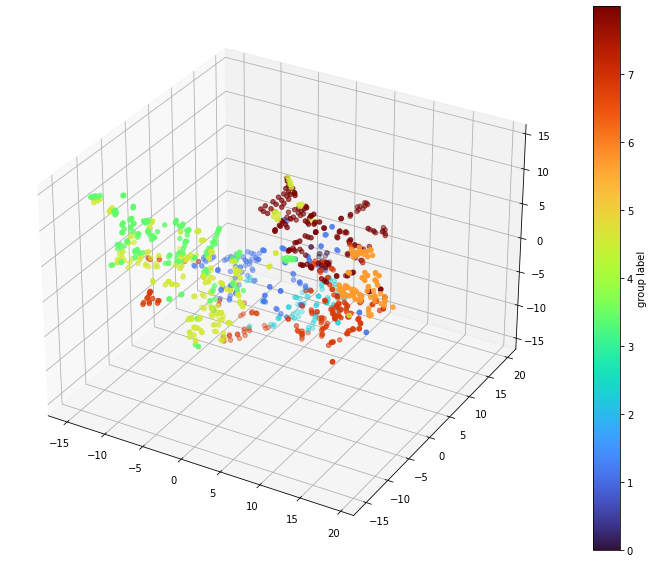

KMeans(n_clusters=6, random_state=0)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



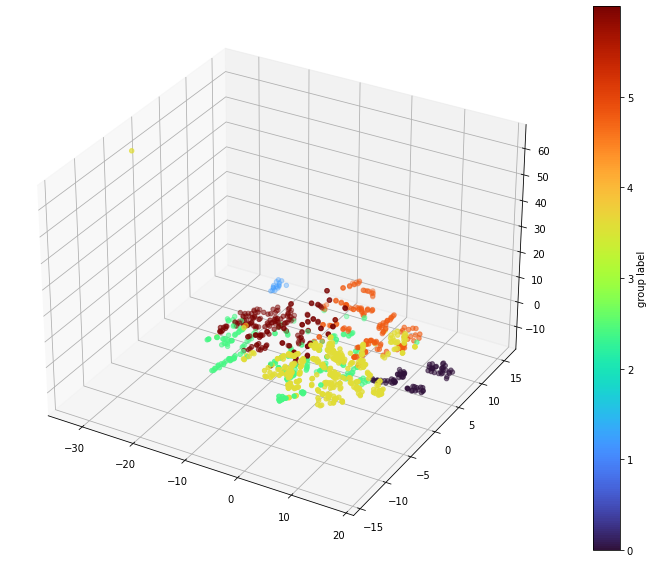

KMeans(init=array([[0.03421512, 0.03264548, 0.02941334, 0.02882703, 0.0289606 ,
        0.02939185, 0.02969589, 0.02056808, 0.02941282, 0.03261399,
        0.03645586, 0.0287162 , 0.02828685, 0.02901493, 0.02874839,
        0.02432441, 0.02827692, 0.02573302, 0.02828045, 0.02810614,
        0.03511003, 0.03055876, 0.03007277, 0.02643796, 0.03097396,
        0.03050133, 0.03103447, 0.0290652 , 0.02920548, 0.0312463 ,
        0.03...
        0.03226002, 0.03854516, 0.03239508, 0.03474077, 0.03162731,
        0.02435488, 0.02942536, 0.03106927, 0.02775964, 0.02958727,
        0.0291433 , 0.0271459 , 0.03064457, 0.03017705, 0.02956352,
        0.02790505, 0.03121961, 0.02979977, 0.02955132, 0.02700851,
        0.0283865 , 0.03254683, 0.03012099, 0.03007787, 0.02758402,
        0.02775964, 0.02880438, 0.0309398 , 0.02675319, 0.02672548,
        0.02695325, 0.03667864]]),
       n_init=1, random_state=0)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



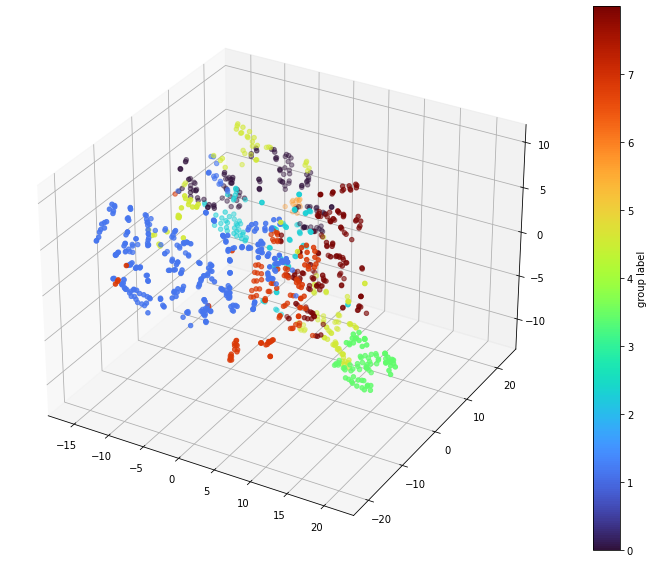

KMedoids(n_clusters=7)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



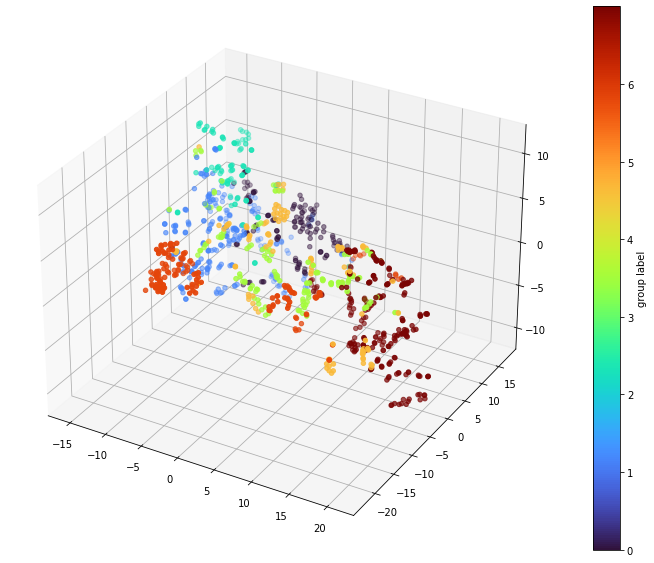

AgglomerativeClustering(n_clusters=8)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



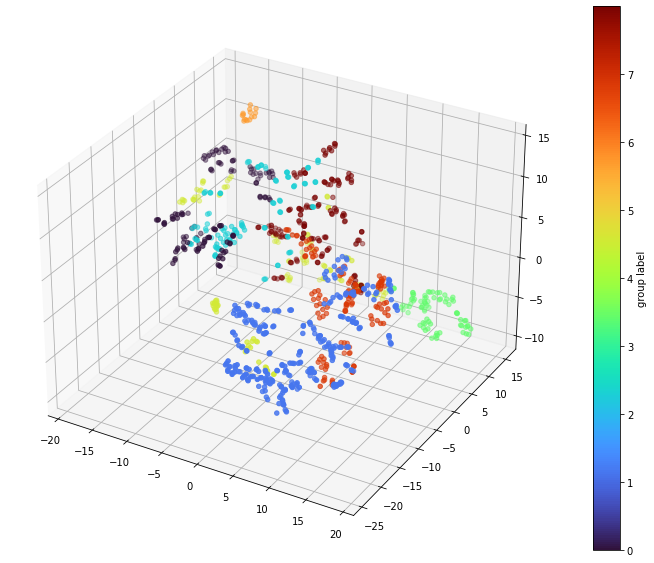

DBSCAN(eps=1, min_samples=0)


C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\boter\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



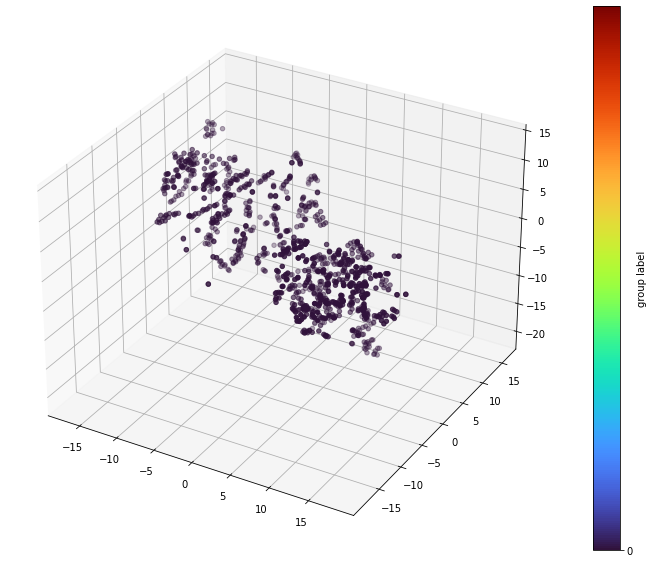

In [42]:
for model in [r_kmeans, kmeans_plus, hmodel, k_medoids, agglo, dbscan]:
    print(model)
    plt.figure()
    tsne3d(X, model.fit_predict(X))
    plt.show()
    plt.figure()
    umap3d(X, model.fit_predict(X))
    plt.show()

## PCA analysis

We might also want to perform a dimensionality reduction, to see if the results change. In order to choose the best number of PCs, we will use the elbow method, by looking at the elbow of the scree plot. We can see that the best number seems to be around 7 PCs.

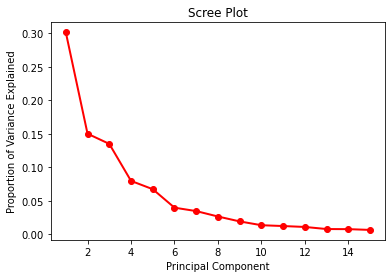

In [43]:
pca = PCA(n_components=15)
X_prj =pca.fit_transform(X)

PC_values = np.arange(pca.n_components_) + 1
plt.plot(PC_values, pca.explained_variance_ratio_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

In [44]:
pca = PCA(n_components=7)
X_prj = pca.fit_transform(X)

We can then repeat the same analysis, but considering only the first 7 PCs.

In [45]:
# Random
r_kmeans7 = KMeans(n_clusters=8, init='random', random_state=0)             
print("Random Kmeans purity", purity_score(Y, r_kmeans7.fit_predict(X_prj)))
print("Random Kmeans f-score", f1_score(Y, r_kmeans7.fit_predict(X_prj), average = 'weighted'))
print("Random Kmeans Jaccard similarity", jaccard_score(Y, r_kmeans7.fit_predict(X_prj), average = 'weighted'))
print("Random Kmeans 1/entropy", 1/(entropy_score(Y, r_kmeans7.fit_predict(X_prj))))

print('\n')

# K-Means++
kmeans_plus7 = KMeans(n_clusters=6, init='k-means++', random_state=0)             
print("Kmeans++ purity", purity_score(Y, kmeans_plus7.fit_predict(X_prj)))
print("Kmeans++ f-score", f1_score(Y, kmeans_plus7.fit_predict(X_prj), average = 'weighted'))
print("Kmeans++ Jaccard similarity", jaccard_score(Y, kmeans_plus7.fit_predict(X_prj), average = 'weighted'))
print("Kmeans++ 1/entropy", 1/(entropy_score(Y, kmeans_plus7.fit_predict(X_prj))))

print('\n')

# Hierarchical+Kmeans
hmodel7 = AgglomerativeClustering(n_clusters=8, 
                                 distance_threshold=distance_threshold, 
                                 affinity='euclidean', linkage='ward')
y_predict = hmodel7.fit_predict(X_prj)
centroids = np.stack([X_prj[y_predict==k].mean(0) for k in range(8)])
hmodel7 = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=0)            
print("Hierarchical+Kmeans purity", purity_score(Y, hmodel7.fit_predict(X_prj)))
print("Hierarchical+Kmeans f-score", f1_score(Y, hmodel7.fit_predict(X_prj), average = 'weighted'))
print("Hierarchical+Kmeans Jaccard similarity", jaccard_score(Y, hmodel7.fit_predict(X_prj), average = 'weighted'))
print("Hierarchical+Kmeans 1/entropy", 1/(entropy_score(Y, hmodel7.fit_predict(X_prj))))

print('\n')

# K-medoids
k_medoids7 = KMedoids(n_clusters=7, metric='euclidean', method='alternate', init='heuristic', max_iter=300, random_state=None)
print("K-medoids purity", purity_score(Y, k_medoids7.fit_predict(X_prj)))
print("K-medoids f-score", f1_score(Y, k_medoids7.fit_predict(X_prj), average = 'weighted'))
print("K-medoids Jaccard similarity", jaccard_score(Y, k_medoids7.fit_predict(X_prj), average = 'weighted'))
print("K-medoids 1/entropy", 1/(entropy_score(Y, k_medoids7.fit_predict(X_prj))))

print('\n')

# Agglomerative
agglo7 = AgglomerativeClustering(n_clusters=8, distance_threshold=distance_threshold, affinity='euclidean', linkage='ward')
print("Agglomerative purity", purity_score(Y, agglo7.fit_predict(X_prj)))
print("Agglomerative f-score", f1_score(Y, agglo7.fit_predict(X_prj), average = 'weighted'))
print("Agglomerative Jaccard similarity", jaccard_score(Y, agglo7.fit_predict(X_prj), average = 'weighted'))
print("Agglomerative 1/entropy", 1/(entropy_score(Y, agglo7.fit_predict(X_prj))))

print('\n')

# DBSCAN
dbscan7 = DBSCAN(eps=1, min_samples=0)
print("DBSCAN purity", purity_score(Y, dbscan7.fit_predict(X_prj)))
print("DBSCAN f-score", f1_score(Y, dbscan7.fit_predict(X_prj), average = 'weighted'))
print("DBSCAN Jaccard similarity", jaccard_score(Y, dbscan7.fit_predict(X_prj), average = 'weighted'))
print("DBSCAN 1/entropy", 1/(entropy_score(Y, dbscan7.fit_predict(X_prj))))


Random Kmeans purity 0.40018570102135564
Random Kmeans f-score 0.18252062866655155
Random Kmeans Jaccard similarity 0.11227424984117026
Random Kmeans 1/entropy 0.4902197059276146


Kmeans++ purity 0.36397400185701023
Kmeans++ f-score 0.07583093012569571
Kmeans++ Jaccard similarity 0.04237465306274958
Kmeans++ 1/entropy 0.49060341956433356


Hierarchical+Kmeans purity 0.3779015784586815
Hierarchical+Kmeans f-score 0.09533902615157545
Hierarchical+Kmeans Jaccard similarity 0.054755389203481664
Hierarchical+Kmeans 1/entropy 0.5022009917334782


K-medoids purity 0.37418755803156917
K-medoids f-score 0.0897918311565877
K-medoids Jaccard similarity 0.05320808305757673
K-medoids 1/entropy 0.4765704274930334


Agglomerative purity 0.4206128133704735
Agglomerative f-score 0.13083503424689785
Agglomerative Jaccard similarity 0.07872466255849002
Agglomerative 1/entropy 0.5578661045003808


DBSCAN purity 0.1392757660167131
DBSCAN f-score 0.03405275452731371
DBSCAN Jaccard similarity 0.019397738999

Random K-means PCA 1/dispersion score is: 0.8408255099709389
Random K-means PCA correlation score is: 0.42730784560268975
Random K-means PCA silhouette score is: 0.20824928505274587 

K-means++ PCA 1/dispersion score is: 0.7215828827575997
K-means++ PCA correlation score is: 0.5208142739626117
K-means++ PCA silhouette score is: 0.23928524107654464 

K-medoids PCA 1/dispersion score is: 0.026353099354439732
K-medoids PCA correlation score is: 0.42028366930580074
K-medoids PCA silhouette score is: 0.14829957862785936 

Hierarchical+K-means 1/dispersion score is: not determined
Hierarchical+K-means correlation score is: 0.4569817594806347
Hierarchical+K-means silhouette score is: 0.22661955504567033 

Agglomerative 1/dispersion score is: not determined
Agglomerative correlation score is: 0.46029380269470765
Agglomerative silhouette score is: 0.1967913625511566 

DBSCAN 1/dispersion score is: not determined
DBSCAN correlation score is: 0.9911667721035928
DBSCAN silhouette score is: not det

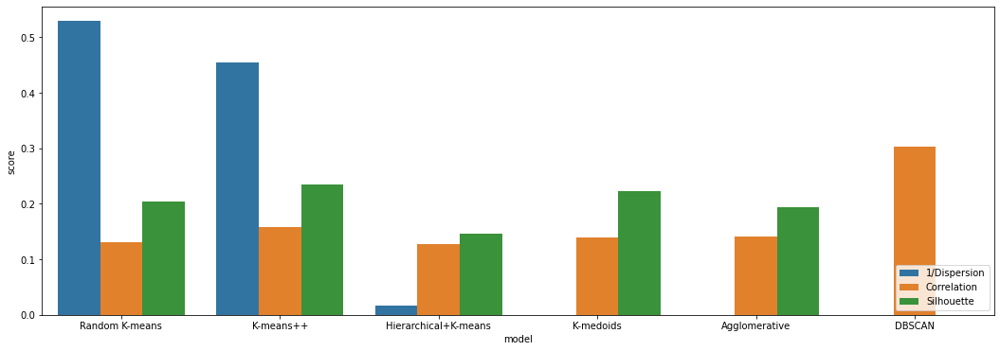

In [46]:
dispersion_scores, correlation_scores, silhouette_scores = [], [], []

for name, model in [('Random K-means PCA', r_kmeans7), ('K-means++ PCA', kmeans_plus7), ('K-medoids PCA', k_medoids7)]:
    # dispersion taken as 1/dispersion because all the other scores have higher scores for better clusterings, whereas dispersion would be the contrary
    dispersion_scores.append(1/(model.fit(X_prj).inertia_))
    print(f'{name} 1/dispersion score is: {1/(model.fit(X_prj).inertia_)}')
    correlation_scores.append(correlation(X_prj, model.fit_predict(X_prj), metric = 'euclidean'))
    print(f'{name} correlation score is: {correlation(X_prj, model.fit_predict(X_prj), metric = "euclidean")}')
    silhouette_scores.append(silhouette_score(X_prj, model.fit_predict(X_prj), metric='euclidean'))
    print(f'{name} silhouette score is: {silhouette_score(X_prj, model.fit_predict(X_prj), metric="euclidean")} \n')

for name, model in [('Hierarchical+K-means',hmodel7), ('Agglomerative', agglo7)]:
    dispersion_scores.append(0)
    print(f'{name} 1/dispersion score is: not determined')
    correlation_scores.append(correlation(X_prj, model.fit_predict(X_prj), metric = 'euclidean'))
    print(f'{name} correlation score is: {correlation(X_prj, model.fit_predict(X_prj), metric = "euclidean")}')
    silhouette_scores.append(silhouette_score(X_prj, model.fit_predict(X_prj), metric='euclidean'))
    print(f'{name} silhouette score is: {silhouette_score(X_prj, model.fit_predict(X_prj), metric="euclidean")} \n')
    
dispersion_scores.append(0)
print(f'DBSCAN 1/dispersion score is: not determined')
correlation_scores.append(correlation(X_prj, dbscan7.fit_predict(X_prj), metric = 'euclidean'))
print(f'DBSCAN correlation score is: {correlation(X_prj, dbscan7.fit_predict(X_prj), metric = "euclidean")}')
silhouette_scores.append(0)
print(f'DBSCAN silhouette score is: not determined \n')
        
# Standardization for representation purposes
dispersion_scores = [x/sum(dispersion_scores) for x in dispersion_scores]
correlation_scores = [x/sum(correlation_scores) for x in correlation_scores]
silhouette_scores = [x/sum(silhouette_scores) for x in silhouette_scores]


data = pd.DataFrame()
data['model'] =  ['Random K-means', 'K-means++', 'Hierarchical+K-means', 'K-medoids', 'Agglomerative', 'DBSCAN'] * 3
data['metric'] = ['1/Dispersion'] * len(dispersion_scores) + ['Correlation'] * len(correlation_scores) + ['Silhouette'] * len(silhouette_scores) 
data['score'] = dispersion_scores + correlation_scores + silhouette_scores

fig_dims = (18, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='model', y='score', data=data, hue='metric', ax = ax)
plt.legend(loc='lower right')

We still get more or less the same results as before, but random+kmeans dispersion gets lower then the one of K-means++.

For external scorings instead:

Random K-means PCA purity score is: 0.40018570102135564
Random K-means PCA f1 score is: 0.18252062866655155
Random K-means PCA Jaccard score is: 0.11227424984117026
Random K-means PCA 1/entropy score is: 0.4902197059276146 

K-means++ PCA purity score is: 0.36397400185701023
K-means++ PCA f1 score is: 0.07583093012569571
K-means++ PCA Jaccard score is: 0.04237465306274958
K-means++ PCA 1/entropy score is: 0.49060341956433356 

Hierarchical+Kmeans PCA purity score is: 0.3779015784586815
Hierarchical+Kmeans PCA f1 score is: 0.09533902615157545
Hierarchical+Kmeans PCA Jaccard score is: 0.054755389203481664
Hierarchical+Kmeans PCA 1/entropy score is: 0.5022009917334782 

K-medoids PCA purity score is: 0.37418755803156917
K-medoids PCA f1 score is: 0.0897918311565877
K-medoids PCA Jaccard score is: 0.05320808305757673
K-medoids PCA 1/entropy score is: 0.4765704274930334 

Agglomerative PCA purity score is: 0.4206128133704735
Agglomerative PCA f1 score is: 0.13083503424689785
Agglomerative P

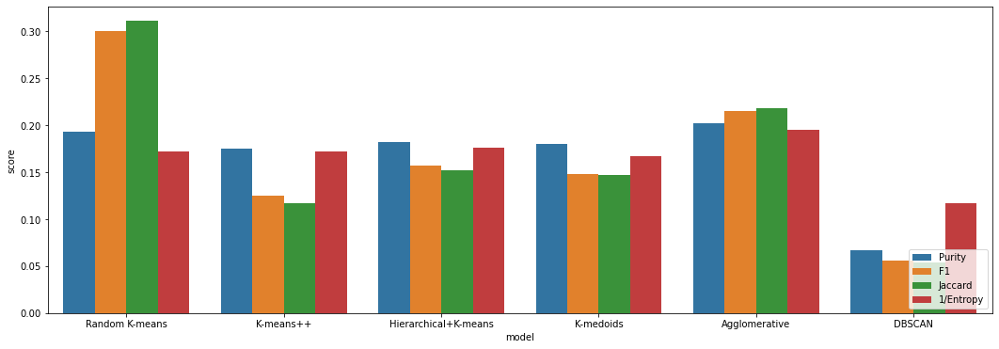

In [47]:
purity_scores, f1_scores, jaccard_scores, entropy_scores = [], [], [], []

for name, model in [('Random K-means PCA', r_kmeans7), ('K-means++ PCA', kmeans_plus7), ('Hierarchical+Kmeans PCA', hmodel7),
                    ('K-medoids PCA', k_medoids7), ('Agglomerative PCA', agglo7), ('DBSCAN PCA', dbscan7)]:
    
    purity_scores.append(purity_score(Y, model.fit_predict(X_prj)))
    print(f'{name} purity score is: {purity_score(Y, model.fit_predict(X_prj))}')
    f1_scores.append(f1_score(Y, model.fit_predict(X_prj), average = 'weighted'))
    print(f'{name} f1 score is: {f1_score(Y, model.fit_predict(X_prj), average = "weighted")}')
    jaccard_scores.append(jaccard_score(Y, model.fit_predict(X_prj), average = "weighted"))
    print(f'{name} Jaccard score is: {jaccard_score(Y, model.fit_predict(X_prj), average = "weighted")}')
    # entropy taken as 1/entropy because all the other scores have higher scores for better clusterings, whereas entropy would be the contrary
    entropy_scores.append(1/(entropy_score(Y, model.fit_predict(X_prj))))
    print(f'{name} 1/entropy score is: {1/(entropy_score(Y, model.fit_predict(X_prj)))} \n')

# Standardization for representation purposes
purity_scores = [x/sum(purity_scores) for x in purity_scores]
f1_scores = [x/sum(f1_scores) for x in f1_scores]
jaccard_scores = [x/sum(jaccard_scores) for x in jaccard_scores]
entropy_scores = [x/sum(entropy_scores) for x in entropy_scores]


data = pd.DataFrame()
data['model'] =  ['Random K-means', 'K-means++', 'Hierarchical+K-means', 'K-medoids', 'Agglomerative', 'DBSCAN'] * 4
data['metric'] = ['Purity'] * len(purity_scores) + ['F1'] * len(f1_scores) + ['Jaccard'] * len(jaccard_scores) + ['1/Entropy'] * len(entropy_scores)
data['score'] = purity_scores + f1_scores + jaccard_scores + entropy_scores

fig_dims = (18, 6)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='model', y='score', data=data, hue='metric', ax = ax)
plt.legend(loc='lower right')

We can see that now random K-means has the highest F1 and Jaccard scores, but the model with highest purity and lowest entropy is still the agglomerative one.

## External scores summary

Given that we privilege the external scores, we can produce a table of the different models ordered based on their external scores.

In [48]:
purity_scores, f1_scores, jaccard_scores, entropy_scores = {}, {}, {}, {}

for name, model in [('Random K-means PCA', r_kmeans7), ('K-means++ PCA', kmeans_plus7), ('Hierarchical+Kmeans PCA', hmodel7),
                    ('K-medoids PCA', k_medoids7), ('Agglomerative PCA', agglo7), ('DBSCAN PCA', dbscan7)]:
    
    purity_scores[name] = purity_score(Y, model.fit_predict(X_prj))
    f1_scores[name] = f1_score(Y, model.fit_predict(X_prj), average = 'weighted')
    jaccard_scores[name] = jaccard_score(Y, model.fit_predict(X_prj), average = "weighted")
    entropy_scores[name] = 1/(entropy_score(Y, model.fit_predict(X_prj)))
    
for name, model in [('Random K-means', r_kmeans), ('K-means++', kmeans_plus), ('Hierarchical+Kmeans', hmodel),
                    ('K-medoids', k_medoids), ('Agglomerative', agglo), ('DBSCAN', dbscan)]:
    purity_scores[name] = purity_score(Y, model.fit_predict(X))
    f1_scores[name] = f1_score(Y, model.fit_predict(X), average = 'weighted')
    jaccard_scores[name] = jaccard_score(Y, model.fit_predict(X), average = "weighted")
    entropy_scores[name] = 1/(entropy_score(Y, model.fit_predict(X)))

purity_scores = {k: v for k, v in sorted(purity_scores.items(), key=lambda item: item[1], reverse = True)}

f1_scores = {k: v for k, v in sorted(f1_scores.items(), key=lambda item: item[1], reverse = True)}

jaccard_scores = {k: v for k, v in sorted(jaccard_scores.items(), key=lambda item: item[1], reverse = True)}

entropy_scores = {k: v for k, v in sorted(entropy_scores.items(), key=lambda item: item[1], reverse = True)}


ordered_models = pd.DataFrame({'Jaccard model': jaccard_scores.keys(), 'Jaccard score': jaccard_scores.values(),
                               'F1 model': f1_scores.keys(), 'F1 score': f1_scores.values(),
                               'Purity model': purity_scores.keys(), 'Purity score': purity_scores.values(),
                               '1/Entropy model': entropy_scores.keys(), '1/Entropy score': entropy_scores.values(),
                               'Order' : ['1st', '2nd', '3rd', '4th', '5th', '6th', '7th', '8th', '9th', '10th', '11th', '12th']})

ordered_models = ordered_models.set_index('Order')

ordered_models

,Jaccard model,Jaccard score,F1 model,F1 score,Purity model,Purity score,1/Entropy model,1/Entropy score
Order,,,,,,,,
1st,Random K-means PCA,0.112274,Random K-means PCA,0.182521,Agglomerative PCA,0.420613,Agglomerative PCA,0.557866
2nd,K-medoids,0.091625,K-medoids,0.152653,Agglomerative,0.405757,Agglomerative,0.538671
3rd,Random K-means,0.087608,K-means++,0.144275,Random K-means,0.404828,Hierarchical+Kmeans,0.507402
4th,K-means++,0.084466,Random K-means,0.141235,Random K-means PCA,0.400186,K-medoids,0.504494
5th,Agglomerative PCA,0.078725,Agglomerative,0.131008,K-medoids,0.389972,Hierarchical+Kmeans PCA,0.502201
6th,Agglomerative,0.074412,Agglomerative PCA,0.130835,Hierarchical+Kmeans,0.383473,Random K-means,0.500974
7th,Hierarchical+Kmeans,0.058665,Hierarchical+Kmeans,0.106107,Hierarchical+Kmeans PCA,0.377902,K-means++ PCA,0.490603
8th,Hierarchical+Kmeans PCA,0.054755,Hierarchical+Kmeans PCA,0.095339,K-medoids PCA,0.374188,Random K-means PCA,0.490220
9th,K-medoids PCA,0.053208,K-medoids PCA,0.089792,K-means++ PCA,0.363974,K-means++,0.484926


# Conclusions

We can say that the best clustering model for our data is the agglomerative one, since it has the highest purity and lowest entropy, expecially after the PCA, and also very high F1 and Jaccard scores. Also the random K-means with the PCA has good external scores, but has an high entropy. K-medoids has high scores considering all the dimensions and deminishes when applying the PCA.

The worst model overall is the DBSCAN model, which only finds one big cluster. This indicates that our data cannot be clustered based on density, so DBSCAN is not the right model. It doesn't change when applying the PCA.

In general, the best scoring are obtained by models after the PCA, so we might want to decrease the dimensionality of our data.

We might have stick to a lower number of clusters as highlighted by the silhouette score, that suggest that the best number of clusters was around 2, but that would have meant lower external scores. In general we can say that probabily some output classes don't have much differences in terms of protein expression levels, and so we could not obtain high scores in both interal and external scorings.